<a href="https://colab.research.google.com/github/frnocentini/brain-tumor-object-dectection/blob/main/ResNet101V2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd '/content/drive/MyDrive/dataset brain tumor/dataset'


/content/drive/MyDrive/dataset brain tumor/dataset


In [3]:
!unzip 'axial_t1wce_2_class' -d '/dataset unzipped'

Archive:  axial_t1wce_2_class.zip
  inflating: /dataset unzipped/axial_t1wce_2_class/axial_t1wce_2_class.yaml  
   creating: /dataset unzipped/axial_t1wce_2_class/images/
   creating: /dataset unzipped/axial_t1wce_2_class/images/test/
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_101.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_109.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_111.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_117.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_121.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_126.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_134.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_66.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_75.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/image

In [4]:
!unzip 'coronal_t1wce_2_class' -d '/dataset unzipped'

Archive:  coronal_t1wce_2_class.zip
  inflating: /dataset unzipped/coronal_t1wce_2_class/coronal_t1wce_2_class.yaml  
   creating: /dataset unzipped/coronal_t1wce_2_class/images/
   creating: /dataset unzipped/coronal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/13.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/15.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/17.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/19.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/20.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/23.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/33.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/34.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/35.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/36.jpg  
  inflating: /d

In [5]:
!unzip 'sagittal_t1wce_2_class' -d '/dataset unzipped'

Archive:  sagittal_t1wce_2_class.zip
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_102.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_121.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_140.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_159.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_110.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_129.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_147.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_166.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_154.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_173.jpg  
  inflating: /

In [6]:
# Data Manipulation
import numpy as np
import pandas as pd
import os
# Visualization/Image Processing
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
# Machine Learning
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization, Flatten, MaxPool2D, Dense, Activation
from PIL import Image
# Other
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
import xml.etree.ElementTree as ET
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
import imutils

In [7]:
%cd '/dataset unzipped'

/dataset unzipped


In [8]:
def crop_brain_contour(image, plot=False):
    
    #import imutils
    #import cv2
    #from matplotlib import pyplot as plt
    
    # Convert the image to grayscale, and blur it slightl
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image, then perform a series of erosions +
    # dilations to remove any small regions of noise
    #thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)
    thresh = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY)[1]
    #thresh = cv2.erode(thresh, None, iterations=2)
    #thresh = cv2.dilate(thresh, None, iterations=2)

    # Find contours in thresholded image, then grab the largest one
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)
    

    # Find the extreme points
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    # crop new image out of the original image using the four extreme points (left, right, top, bottom)
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]            

    if plot:
        plt.figure()

        plt.subplot(1, 2, 1)
        plt.imshow(image)
        
        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        
        plt.title('Original Image')
            
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)

        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)

        plt.title('Cropped Image')
        
        plt.show()
    
    return new_image,extLeft,extRight,extTop,extBot

In [9]:
#Bounding box with one tumor
lab = ['axial_t1wce_2_class','coronal_t1wce_2_class', 'sagittal_t1wce_2_class']
X_train = []
bb = []
count = 0;
temp_array  = []
extLeft_coords_x = []
extLeft_coords_y = []
extRight_coords_x = []
extRight_coords_y = []
extTop_coords_x = []
extTop_coords_y = []
extBot_coords_x = []
extBot_coords_y = []
image_width = []
image_height = []


extLeft_coords_x_test = []
extLeft_coords_y_test = []
extRight_coords_x_test = []
extRight_coords_y_test = []
extTop_coords_x_test = []
extTop_coords_y_test = []
extBot_coords_x_test = []
extBot_coords_y_test = []
images_width_test = []
images_height_test = []
width_new_im = []
height_new_im = []
traslazione_x_test = []
traslazione_y_test = []

image_size = 224

for i in lab:
    folderPath = os.path.join('./',i,'images','train')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        image_width.append(img.shape[1])
        image_height.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image,extLeft,extRight,extTop,extBot = crop_brain_contour(img,False)
        extLeft_coords_x.append(extLeft[0])
        extLeft_coords_y.append(extLeft[1])
        extRight_coords_x.append(extRight[0])
        extRight_coords_y.append(extRight[1])
        extTop_coords_x.append(extTop[0])
        extTop_coords_y.append(extTop[1])
        extBot_coords_x.append(extBot[0])
        extBot_coords_y.append(extBot[1])
        # resize image
        image = cv2.resize(image, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        #if img.shape[0] != img.shape[1]:
            #img = make_square(img, fill_color=(0, 0, 0, 0))
        #img = cv2.resize(img,(image_size, image_size))
        X_train.append(image)

image_index = 0
#bb_train = np.zeros((len(X_train),4))
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','train')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                 
                temp_array[0] = temp_array[0]*image_width[count] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x[count]
                temp_array[0] = (temp_array[0]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                temp_array[1] = temp_array[1]*image_height[count]
                temp_array[1] = temp_array[1]-extTop_coords_y[count]
                temp_array[1] = (temp_array[1]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size
                
                temp_array[2] = temp_array[2]*(image_width[count])
                temp_array[2] = (temp_array[2]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                
                temp_array[3] = temp_array[3]*(image_height[count])
                temp_array[3] = (temp_array[3]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size                 
            
                lbls_array.append(temp_array)

                #print(temp_array)
                #bb_train[image_index] = np.array([temp_array])
                #print(bb_train[image_index])

            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count += 1

#Codice per duplicare le immagini con due bounding box
print('Dimensione delle liste prima di duplicare le immagini:')
print('X_train: ', len(X_train))
print('bb_list: ', len(bb_list))

for i in range(len(X_train)):
  if(len(duplicate_img[i]) == 2):
    X_train.append(X_train[i])
    bb_list.append(duplicate_img[i][0])  #dentro bb_list è già stata inserita la seconda label, quindi ora insieriamo la prima per l'immagine duplicata
bb_train = np.zeros((len(X_train),4))

for j in range(len(bb_list)):
  bb_train[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimensione delle liste dopo la duplicazione delle immagini:')
print('X_train: ', len(X_train))
print('bb_train: ', len(bb_train))

X_test = []
for i in lab:
    folderPath = os.path.join('./',i,'images','test')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        images_width_test.append(img.shape[1])
        images_height_test.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image_test,extLeft_test,extRight_test,extTop_test,extBot_test = crop_brain_contour(img,False)
        extLeft_coords_x_test.append(extLeft_test[0])
        extLeft_coords_y_test.append(extLeft_test[1])
        extRight_coords_x_test.append(extRight_test[0])
        extRight_coords_y_test.append(extRight_test[1])
        extTop_coords_x_test.append(extTop_test[0])
        extTop_coords_y_test.append(extTop_test[1])
        extBot_coords_x_test.append(extBot_test[0])
        extBot_coords_y_test.append(extBot_test[1])
        # resize image
        image_test = cv2.resize(image_test, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        #if img.shape[0] != img.shape[1]:
            #img = make_square(img, fill_color=(0, 0, 0, 0))
        #img = cv2.resize(img,(image_size, image_size))
        X_test.append(image_test)

image_index = 0
count_test = 0;
#bb_test = np.zeros((len(X_test),4))
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','test')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                #width_new_im.append(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test])
                #height_new_im.append(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test])
                
                
                temp_array[0] = temp_array[0]*images_width_test[count_test] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x_test[count_test]
                temp_array[0] = (temp_array[0]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                temp_array[1] = temp_array[1]*images_height_test[count_test]
                temp_array[1] = temp_array[1]-extTop_coords_y_test[count_test]
                temp_array[1] = (temp_array[1]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size
                
                temp_array[2] = temp_array[2]*(images_width_test[count_test])
                temp_array[2] = (temp_array[2]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                
                temp_array[3] = temp_array[3]*(images_height_test[count_test])
                temp_array[3] = (temp_array[3]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size                 
            
                lbls_array.append(temp_array)

                #bb_test[image_index] = np.array([temp_array])
                #print(bb_test[image_index])

            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count_test += 1

#Codice per duplicare le immagini con due bounding box
print('Dimensione delle liste prima di duplicare le immagini:')
print('X_test: ', len(X_test))
print('bb_list: ', len(bb_list))

for i in range(len(X_test)):
  if(len(duplicate_img[i]) == 2):
    X_test.append(X_test[i])
    bb_list.append(duplicate_img[i][0])  #dentro bb_list è già stata inserita la seconda label, quindi ora insieriamo la prima per l'immagine duplicata

bb_test = np.zeros((len(X_test),4))

for j in range(len(bb_test)):
  bb_test[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimensione delle liste dopo la duplicazione delle immagini:')
print('X_test: ', len(X_test))
print('bb_test: ', len(bb_test))

#print(bb_test[30])
#print(extRight_coords_x_test[30])
#print(extLeft_coords_x_test[30])

Dimensione delle liste prima di duplicare le immagini:
X_train:  878
bb_list:  878
Dimensione delle liste dopo la duplicazione delle immagini:
X_train:  919
bb_train:  919
Dimensione delle liste prima di duplicare le immagini:
X_test:  223
bb_list:  223
Dimensione delle liste dopo la duplicazione delle immagini:
X_test:  237
bb_test:  237


In [10]:
len(X_train)

919

In [11]:
#prepare dataset 
train_dataset = ImageDataGenerator()
val_dataset = ImageDataGenerator()
test_dataset = ImageDataGenerator()

In [12]:
#array conversion
X_train = np.array(X_train)
X_test = np.array(X_test)

In [13]:
#Shuffle
X_train, bb_train = shuffle(X_train, bb_train)

In [14]:
#Validation set created
X_train, X_val, bb_train, bb_val = train_test_split(X_train, bb_train, test_size = 0.1, shuffle = False)

In [15]:
BATCH_SIZE = 16
#save_path = os.path.join('./', 'model_effnet')
train_dataset = train_dataset.flow(X_train, bb_train, batch_size = BATCH_SIZE)
val_dataset = val_dataset.flow(X_val, bb_val, batch_size = BATCH_SIZE)
test_dataset = test_dataset.flow(X_test, bb_test, batch_size = BATCH_SIZE)

In [16]:
METRIC_THRESH = 0.3

def raw_iou(y_true, y_pred):
    results = []
    for i in range(0,y_true.shape[0]):


        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        x_boxTrue_tleft = y_true[i,0]-boxTrue_width/2  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]-boxTrue_height/2
    
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        x_boxPred_tleft = y_pred[i,0]-boxPred_width/2  
        y_boxPred_tleft = y_pred[i,1]-boxPred_height/2
    
        area_boxPred = (boxPred_width * boxPred_height)


        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        
        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = np.mean(area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)).astype(np.float32)


        # This must match the type used in py_func
        results.append(iou)
    return np.mean(results)

def IoU(y_true, y_pred):
    iou = tf.numpy_function(raw_iou, [y_true, y_pred], tf.float32)
    return iou



In [17]:
#def iou(y_true,y_pred):
  #pred_bbox_val = model.predict(X_val)
  #iou = tf.numpy_function(calculate_iou,[y_true,y_pred],tf.float32)
  #return iou

In [18]:
# Draw the predicted bounding boxes
def display_image(img, bbox_coords, pred_coords):
    if len(bbox_coords) == 4: #in rosso
        xmin, ymin, width, height = bbox_coords
        img = cv2.rectangle(img, (int(xmin-width/2), int(ymin-height/2)), (int(xmin+width/2), int(ymin+height/2)), (255, 0, 0), 1)
        #img = cv2.rectangle(img, (0,0),(10,10), (0, 0, 255), 1)
    if len(pred_coords) == 4: #in verde
        xmin1, ymin1, width1, height1 = pred_coords
        img = cv2.rectangle(img, (int(xmin1-width1/2), int(ymin1-height1/2)), (int(xmin1+width1/2), int(ymin1+height1/2)), (0, 255, 0), 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

In [19]:
#To test the model
def test_model(model):
    rand_index = np.random.randint(0, bb_test.shape[0])
    pred_bbox = model.predict(X_test)[rand_index]
    img_original = X_test[rand_index]
    img = img_original.copy()
    coords = bb_test[rand_index]
    #example, label = next(datagen)
    #X = example['image']
    #y = label['coords']
    #pred_bbox = model.predict(X)[0]
    #img = X[0]
    #gt_coords = y[0]
    
    display_image(img,bbox_coords = coords, pred_coords=pred_bbox)

def test(model):
    
    plt.figure(figsize=(15,7))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        test_model(model)    
    plt.show()

class ShowTestImages(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test(self.model)
        

In [20]:
%cd '../content/drive/MyDrive'
! mkdir  model_checkpoint_RESNET

/content/drive/MyDrive
mkdir: cannot create directory ‘model_checkpoint_RESNET’: File exists


In [21]:
save_path = './model_checkpoint_RESNET/model_RESNET.h5'

In [22]:
callbacks_list = [
    keras.callbacks.ModelCheckpoint(
    filepath=save_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
    monitor="val_IoU",
    patience=20,
    verbose=0,
    mode="max",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=50,
),

    ShowTestImages()
]

In [23]:
resnet = ResNet101V2(weights='imagenet',include_top=False,input_shape=(image_size,image_size,3))
model = resnet.output
model = tf.keras.layers.AveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Flatten()(model)
model = tf.keras.layers.Dense(4,name='bb_pred')(model)
model = tf.keras.models.Model(inputs=resnet.inputs, outputs = model)

171317808/171317808 [==============================] - 1s 0us/step


In [24]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

Epoch 1/100
52/52 [==============================] - ETA: 0s - loss: 29.2363 - IoU: 0.0989
Epoch 1: val_loss improved from inf to 436.28568, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 142ms/step


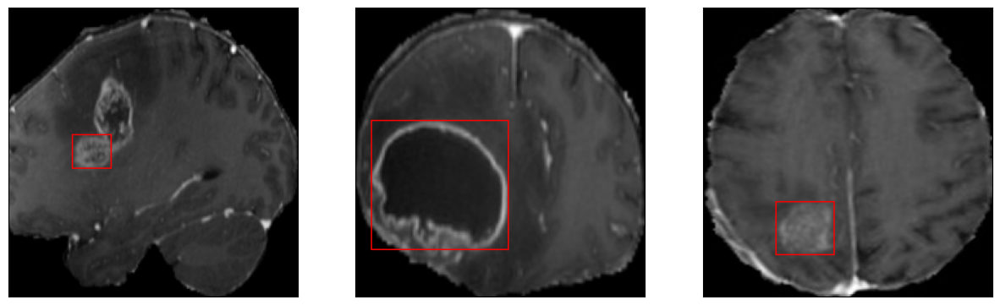

52/52 [==============================] - 114s 691ms/step - loss: 29.2363 - IoU: 0.0989 - val_loss: 436.2857 - val_IoU: 0.0000e+00
Epoch 2/100
52/52 [==============================] - ETA: 0s - loss: 17.6375 - IoU: 0.2435
Epoch 2: val_loss improved from 436.28568 to 161.55209, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 146ms/step


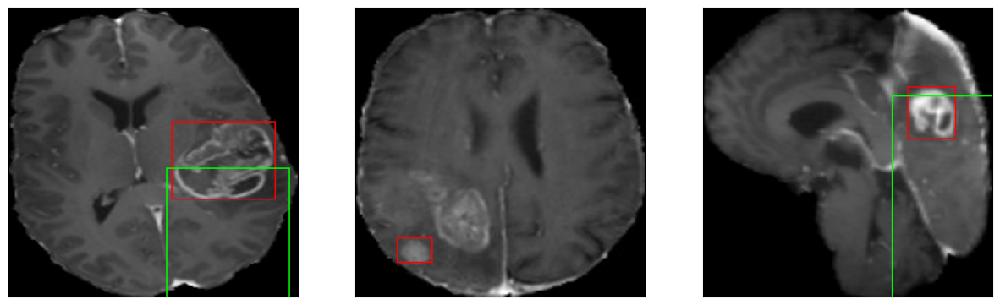

52/52 [==============================] - 31s 606ms/step - loss: 17.6375 - IoU: 0.2435 - val_loss: 161.5521 - val_IoU: 0.0105
Epoch 3/100
52/52 [==============================] - ETA: 0s - loss: 14.5027 - IoU: 0.3252
Epoch 3: val_loss improved from 161.55209 to 34.65015, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 146ms/step


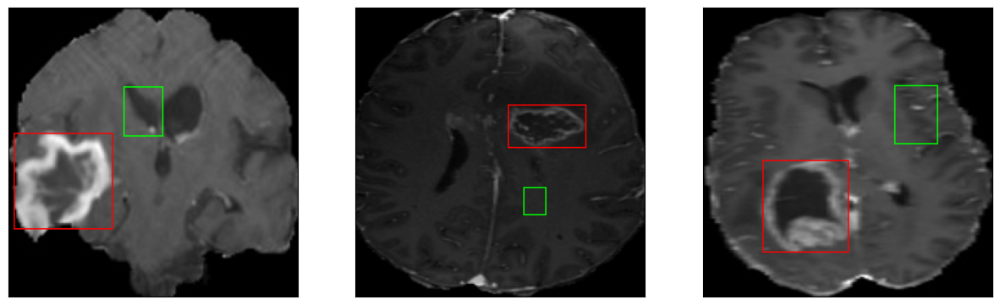

52/52 [==============================] - 31s 603ms/step - loss: 14.5027 - IoU: 0.3252 - val_loss: 34.6502 - val_IoU: 0.0345
Epoch 4/100
52/52 [==============================] - ETA: 0s - loss: 12.8435 - IoU: 0.3797
Epoch 4: val_loss improved from 34.65015 to 33.74347, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 141ms/step


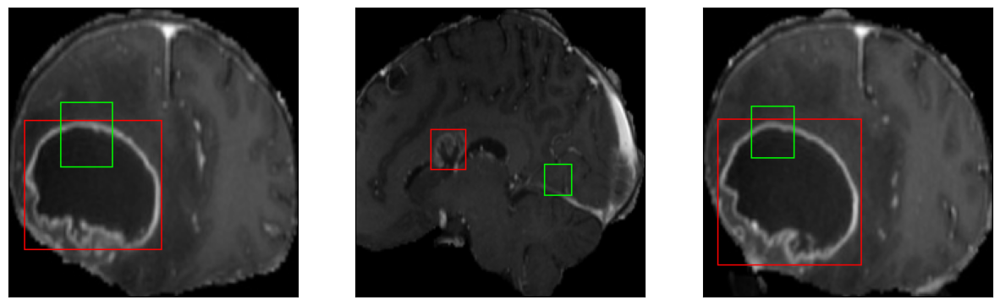

52/52 [==============================] - 35s 689ms/step - loss: 12.8435 - IoU: 0.3797 - val_loss: 33.7435 - val_IoU: 0.0331
Epoch 5/100
52/52 [==============================] - ETA: 0s - loss: 12.2633 - IoU: 0.3797
Epoch 5: val_loss did not improve from 33.74347
8/8 [==============================] - 1s 148ms/step


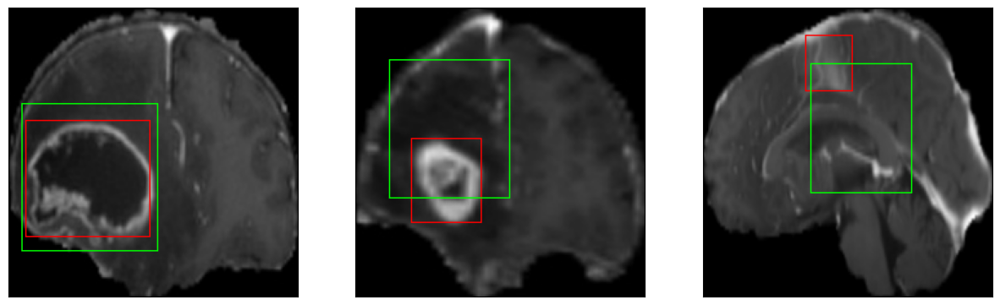

52/52 [==============================] - 20s 391ms/step - loss: 12.2633 - IoU: 0.3797 - val_loss: 45.3498 - val_IoU: 0.2138
Epoch 6/100
52/52 [==============================] - ETA: 0s - loss: 11.7667 - IoU: 0.4113
Epoch 6: val_loss improved from 33.74347 to 18.09769, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


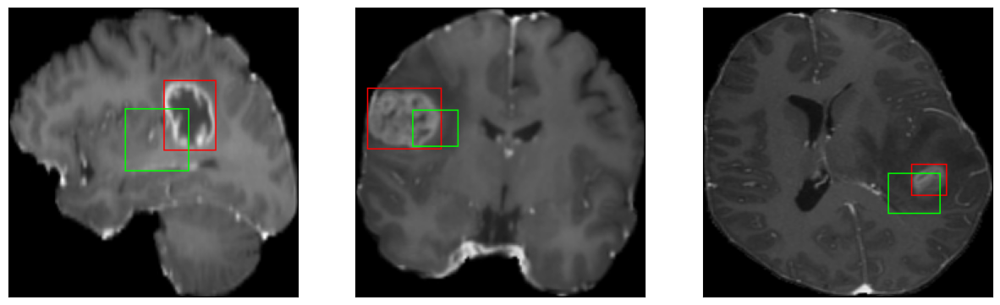

52/52 [==============================] - 33s 632ms/step - loss: 11.7667 - IoU: 0.4113 - val_loss: 18.0977 - val_IoU: 0.2397
Epoch 7/100
52/52 [==============================] - ETA: 0s - loss: 11.6787 - IoU: 0.4123
Epoch 7: val_loss did not improve from 18.09769
8/8 [==============================] - 1s 148ms/step


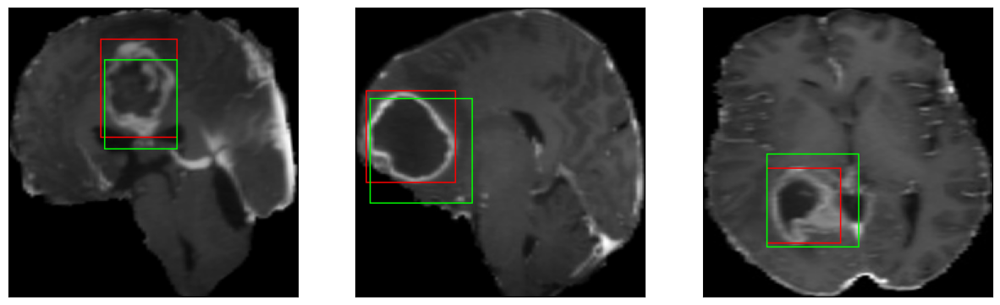

52/52 [==============================] - 20s 392ms/step - loss: 11.6787 - IoU: 0.4123 - val_loss: 21.1728 - val_IoU: 0.3472
Epoch 8/100
52/52 [==============================] - ETA: 0s - loss: 10.7740 - IoU: 0.4288
Epoch 8: val_loss did not improve from 18.09769
8/8 [==============================] - 1s 146ms/step


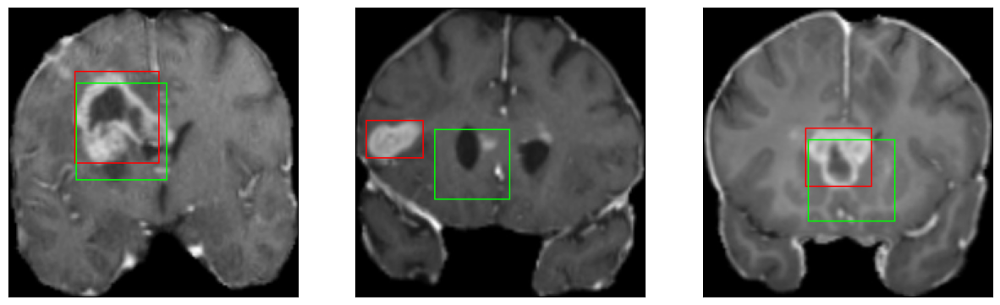

52/52 [==============================] - 20s 384ms/step - loss: 10.7740 - IoU: 0.4288 - val_loss: 19.1455 - val_IoU: 0.2706
Epoch 9/100
52/52 [==============================] - ETA: 0s - loss: 10.1736 - IoU: 0.4604
Epoch 9: val_loss did not improve from 18.09769
8/8 [==============================] - 1s 146ms/step


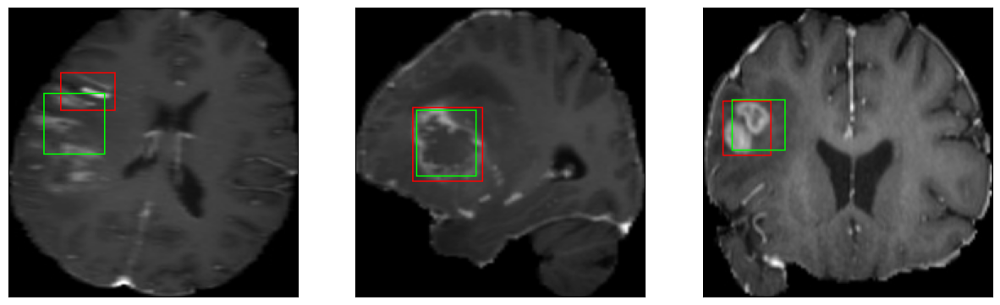

52/52 [==============================] - 20s 388ms/step - loss: 10.1736 - IoU: 0.4604 - val_loss: 21.2285 - val_IoU: 0.2644
Epoch 10/100
52/52 [==============================] - ETA: 0s - loss: 9.8286 - IoU: 0.4681
Epoch 10: val_loss did not improve from 18.09769
8/8 [==============================] - 1s 144ms/step


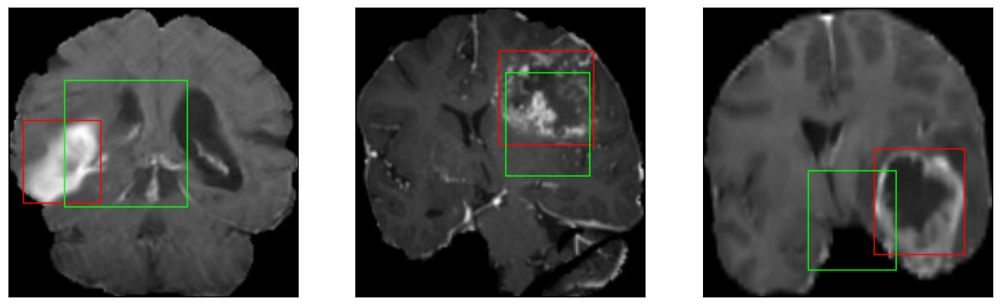

52/52 [==============================] - 20s 386ms/step - loss: 9.8286 - IoU: 0.4681 - val_loss: 24.3473 - val_IoU: 0.2557
Epoch 11/100
52/52 [==============================] - ETA: 0s - loss: 9.7060 - IoU: 0.4751
Epoch 11: val_loss improved from 18.09769 to 13.80575, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


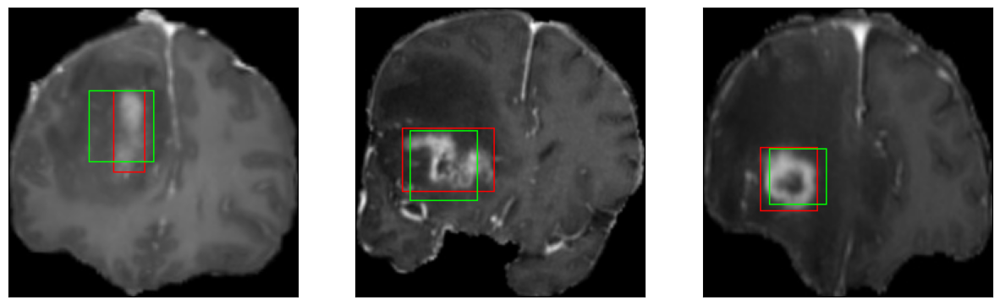

52/52 [==============================] - 33s 633ms/step - loss: 9.7060 - IoU: 0.4751 - val_loss: 13.8058 - val_IoU: 0.4353
Epoch 12/100
52/52 [==============================] - ETA: 0s - loss: 8.6244 - IoU: 0.5165
Epoch 12: val_loss improved from 13.80575 to 11.02671, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 147ms/step


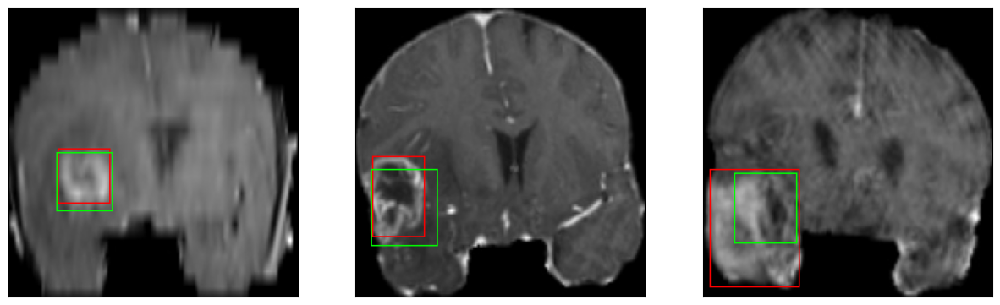

52/52 [==============================] - 30s 591ms/step - loss: 8.6244 - IoU: 0.5165 - val_loss: 11.0267 - val_IoU: 0.4893
Epoch 13/100
52/52 [==============================] - ETA: 0s - loss: 8.1763 - IoU: 0.5369
Epoch 13: val_loss did not improve from 11.02671
8/8 [==============================] - 1s 149ms/step


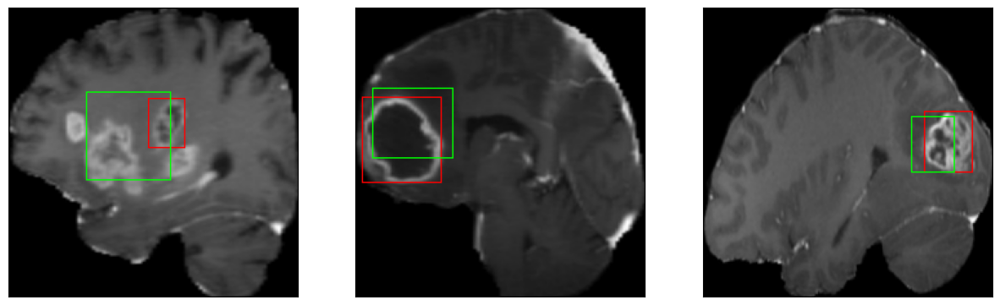

52/52 [==============================] - 20s 390ms/step - loss: 8.1763 - IoU: 0.5369 - val_loss: 11.1507 - val_IoU: 0.4780
Epoch 14/100
52/52 [==============================] - ETA: 0s - loss: 8.1395 - IoU: 0.5337
Epoch 14: val_loss improved from 11.02671 to 9.00445, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


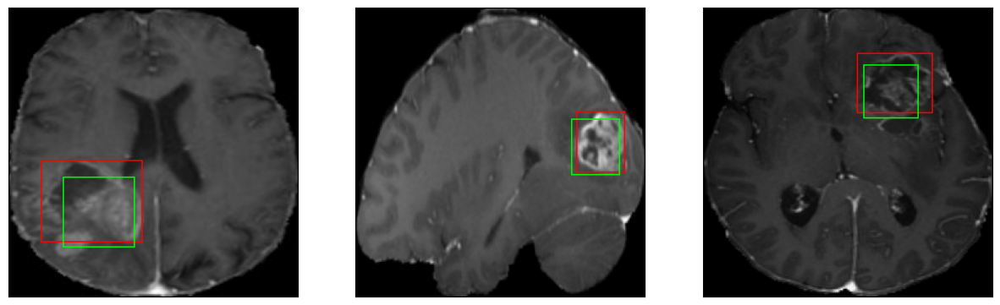

52/52 [==============================] - 32s 614ms/step - loss: 8.1395 - IoU: 0.5337 - val_loss: 9.0044 - val_IoU: 0.5313
Epoch 15/100
52/52 [==============================] - ETA: 0s - loss: 7.8463 - IoU: 0.5378
Epoch 15: val_loss did not improve from 9.00445
8/8 [==============================] - 1s 148ms/step


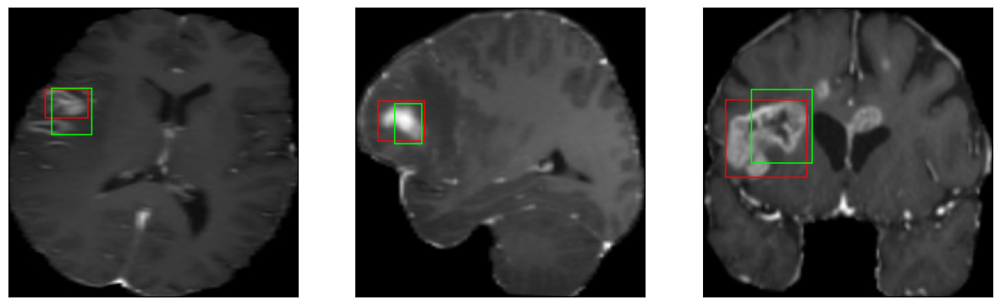

52/52 [==============================] - 20s 390ms/step - loss: 7.8463 - IoU: 0.5378 - val_loss: 9.7971 - val_IoU: 0.5162
Epoch 16/100
52/52 [==============================] - ETA: 0s - loss: 7.8806 - IoU: 0.5465
Epoch 16: val_loss did not improve from 9.00445
8/8 [==============================] - 1s 146ms/step


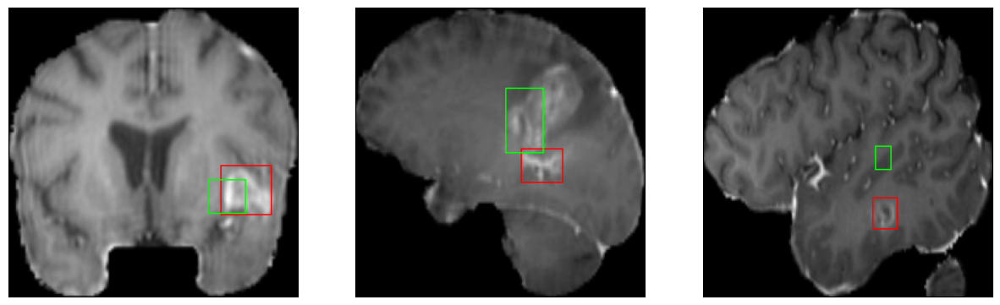

52/52 [==============================] - 20s 392ms/step - loss: 7.8806 - IoU: 0.5465 - val_loss: 10.7883 - val_IoU: 0.4549
Epoch 17/100
52/52 [==============================] - ETA: 0s - loss: 7.4269 - IoU: 0.5552
Epoch 17: val_loss did not improve from 9.00445
8/8 [==============================] - 1s 146ms/step


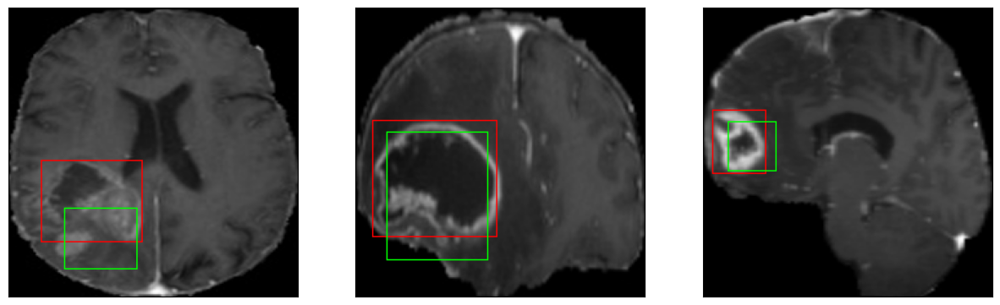

52/52 [==============================] - 20s 388ms/step - loss: 7.4269 - IoU: 0.5552 - val_loss: 10.9024 - val_IoU: 0.4646
Epoch 18/100
52/52 [==============================] - ETA: 0s - loss: 7.5776 - IoU: 0.5530
Epoch 18: val_loss did not improve from 9.00445
8/8 [==============================] - 1s 147ms/step


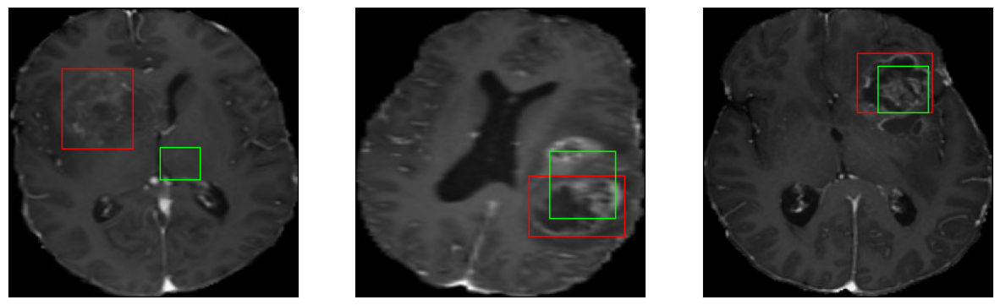

52/52 [==============================] - 20s 382ms/step - loss: 7.5776 - IoU: 0.5530 - val_loss: 9.3815 - val_IoU: 0.5534
Epoch 19/100
52/52 [==============================] - ETA: 0s - loss: 6.9503 - IoU: 0.5777
Epoch 19: val_loss did not improve from 9.00445
8/8 [==============================] - 1s 147ms/step


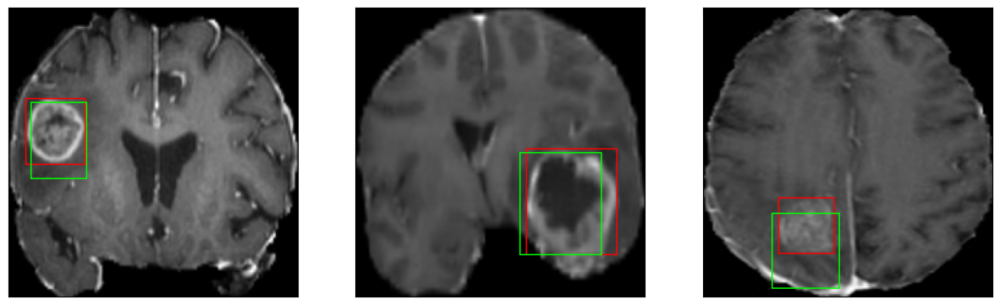

52/52 [==============================] - 20s 390ms/step - loss: 6.9503 - IoU: 0.5777 - val_loss: 10.5136 - val_IoU: 0.5152
Epoch 20/100
52/52 [==============================] - ETA: 0s - loss: 6.8466 - IoU: 0.5742
Epoch 20: val_loss improved from 9.00445 to 8.71315, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


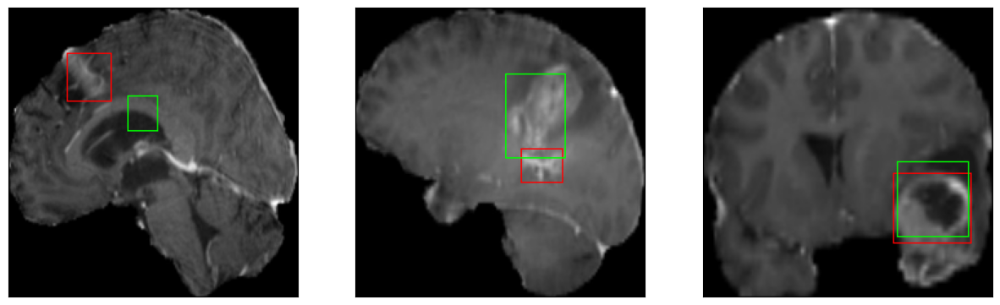

52/52 [==============================] - 33s 644ms/step - loss: 6.8466 - IoU: 0.5742 - val_loss: 8.7131 - val_IoU: 0.5450
Epoch 21/100
52/52 [==============================] - ETA: 0s - loss: 7.0505 - IoU: 0.5746
Epoch 21: val_loss did not improve from 8.71315
8/8 [==============================] - 1s 147ms/step


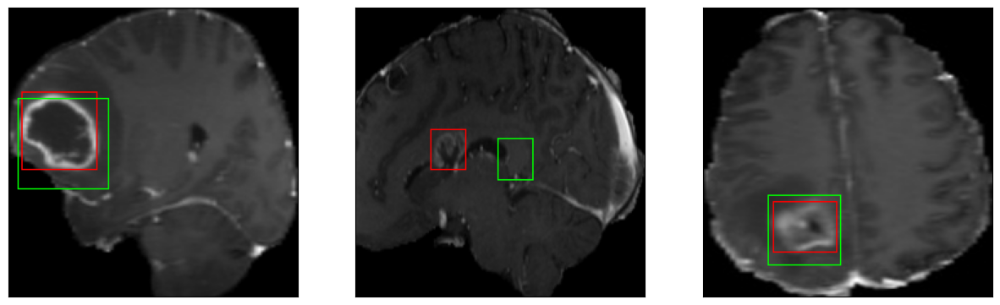

52/52 [==============================] - 20s 388ms/step - loss: 7.0505 - IoU: 0.5746 - val_loss: 11.4892 - val_IoU: 0.5290
Epoch 22/100
52/52 [==============================] - ETA: 0s - loss: 6.8183 - IoU: 0.5801
Epoch 22: val_loss improved from 8.71315 to 7.95931, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


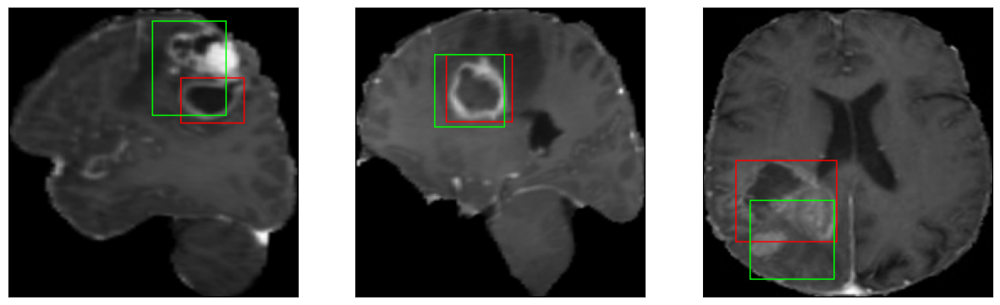

52/52 [==============================] - 38s 748ms/step - loss: 6.8183 - IoU: 0.5801 - val_loss: 7.9593 - val_IoU: 0.5930
Epoch 23/100
52/52 [==============================] - ETA: 0s - loss: 6.4524 - IoU: 0.5967
Epoch 23: val_loss did not improve from 7.95931
8/8 [==============================] - 1s 147ms/step


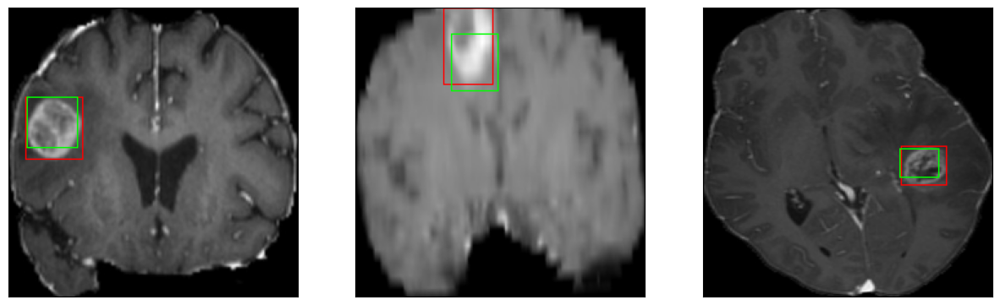

52/52 [==============================] - 20s 389ms/step - loss: 6.4524 - IoU: 0.5967 - val_loss: 8.9825 - val_IoU: 0.5297
Epoch 24/100
52/52 [==============================] - ETA: 0s - loss: 6.5305 - IoU: 0.5852
Epoch 24: val_loss did not improve from 7.95931
8/8 [==============================] - 1s 147ms/step


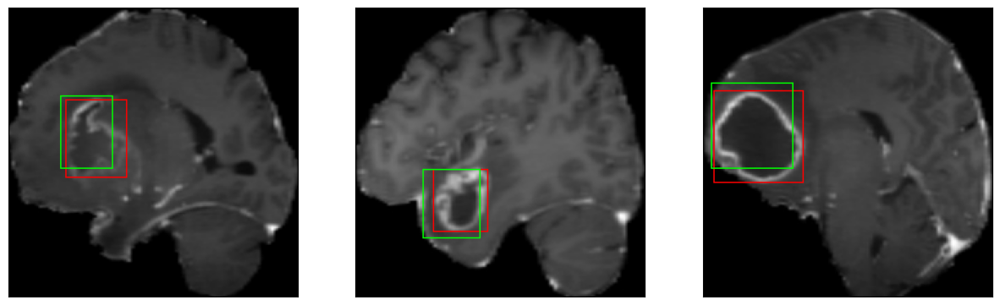

52/52 [==============================] - 20s 388ms/step - loss: 6.5305 - IoU: 0.5852 - val_loss: 8.0190 - val_IoU: 0.5657
Epoch 25/100
52/52 [==============================] - ETA: 0s - loss: 6.3309 - IoU: 0.5939
Epoch 25: val_loss improved from 7.95931 to 7.33486, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 140ms/step


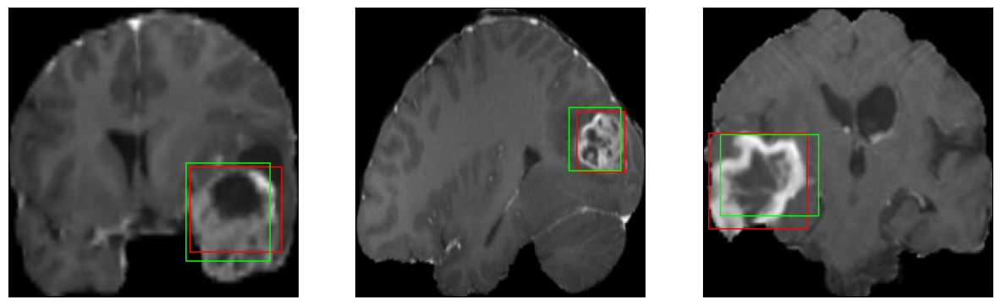

52/52 [==============================] - 35s 681ms/step - loss: 6.3309 - IoU: 0.5939 - val_loss: 7.3349 - val_IoU: 0.5878
Epoch 26/100
52/52 [==============================] - ETA: 0s - loss: 6.2641 - IoU: 0.6053
Epoch 26: val_loss did not improve from 7.33486
8/8 [==============================] - 1s 144ms/step


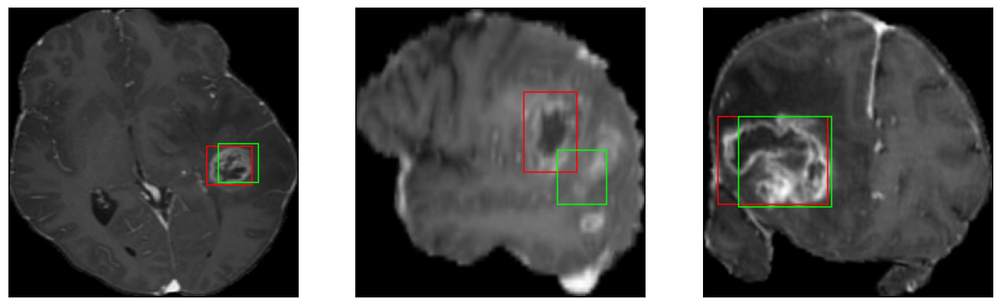

52/52 [==============================] - 20s 386ms/step - loss: 6.2641 - IoU: 0.6053 - val_loss: 7.5206 - val_IoU: 0.6024
Epoch 27/100
52/52 [==============================] - ETA: 0s - loss: 6.4475 - IoU: 0.5878
Epoch 27: val_loss did not improve from 7.33486
8/8 [==============================] - 1s 148ms/step


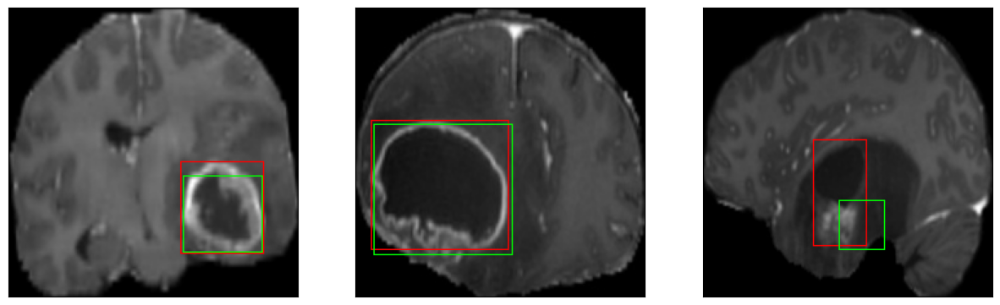

52/52 [==============================] - 20s 392ms/step - loss: 6.4475 - IoU: 0.5878 - val_loss: 8.2988 - val_IoU: 0.5483
Epoch 28/100
52/52 [==============================] - ETA: 0s - loss: 6.1994 - IoU: 0.6028
Epoch 28: val_loss did not improve from 7.33486
8/8 [==============================] - 1s 144ms/step


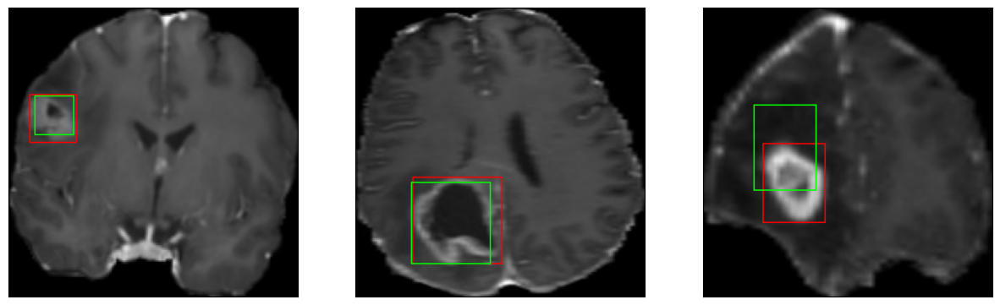

52/52 [==============================] - 20s 388ms/step - loss: 6.1994 - IoU: 0.6028 - val_loss: 7.5503 - val_IoU: 0.5929
Epoch 29/100
52/52 [==============================] - ETA: 0s - loss: 6.0121 - IoU: 0.6151
Epoch 29: val_loss did not improve from 7.33486
8/8 [==============================] - 1s 144ms/step


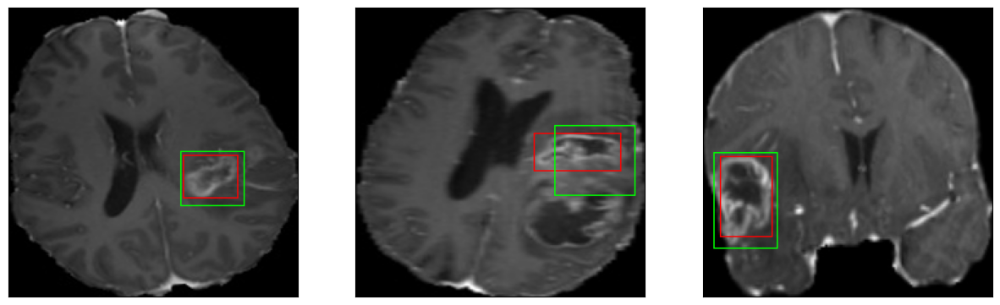

52/52 [==============================] - 20s 390ms/step - loss: 6.0121 - IoU: 0.6151 - val_loss: 8.4767 - val_IoU: 0.5818
Epoch 30/100
52/52 [==============================] - ETA: 0s - loss: 6.7428 - IoU: 0.5902
Epoch 30: val_loss did not improve from 7.33486
8/8 [==============================] - 1s 145ms/step


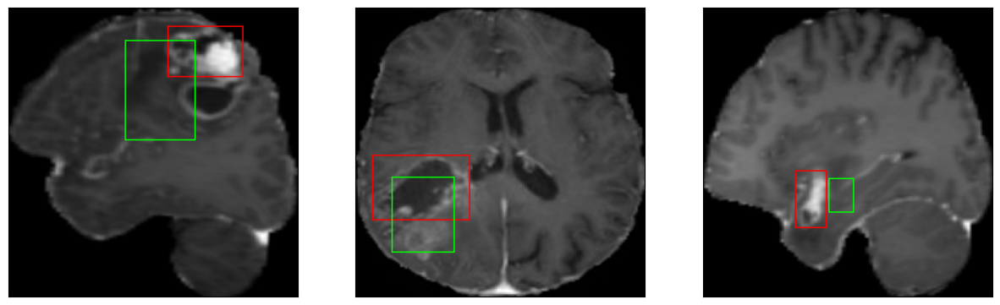

52/52 [==============================] - 20s 385ms/step - loss: 6.7428 - IoU: 0.5902 - val_loss: 12.1662 - val_IoU: 0.4832
Epoch 31/100
52/52 [==============================] - ETA: 0s - loss: 6.1477 - IoU: 0.6150
Epoch 31: val_loss improved from 7.33486 to 6.97581, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


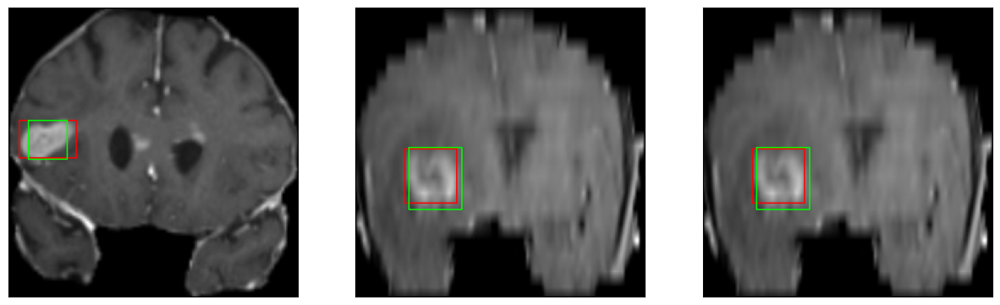

52/52 [==============================] - 37s 727ms/step - loss: 6.1477 - IoU: 0.6150 - val_loss: 6.9758 - val_IoU: 0.6228
Epoch 32/100
52/52 [==============================] - ETA: 0s - loss: 6.0297 - IoU: 0.6043
Epoch 32: val_loss did not improve from 6.97581
8/8 [==============================] - 1s 149ms/step


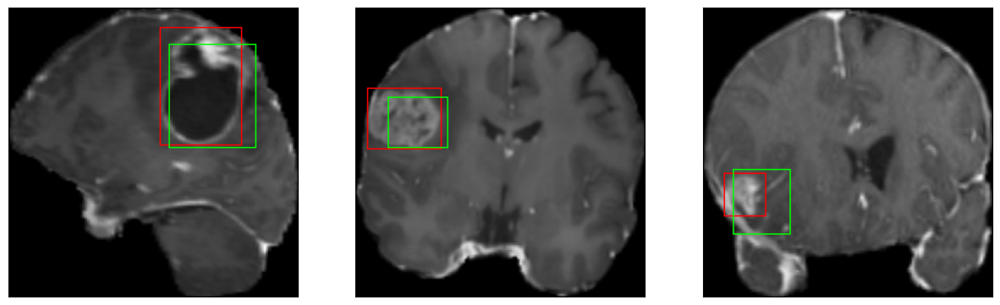

52/52 [==============================] - 21s 397ms/step - loss: 6.0297 - IoU: 0.6043 - val_loss: 8.4457 - val_IoU: 0.5431
Epoch 33/100
52/52 [==============================] - ETA: 0s - loss: 5.9122 - IoU: 0.6166
Epoch 33: val_loss did not improve from 6.97581
8/8 [==============================] - 1s 147ms/step


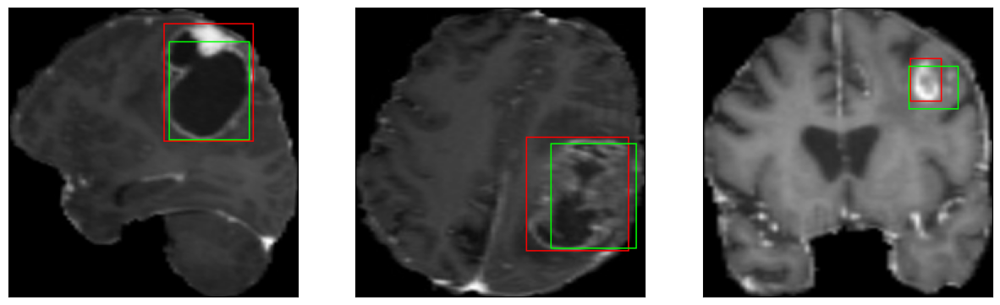

52/52 [==============================] - 20s 393ms/step - loss: 5.9122 - IoU: 0.6166 - val_loss: 7.9855 - val_IoU: 0.5977
Epoch 34/100
52/52 [==============================] - ETA: 0s - loss: 6.4088 - IoU: 0.5910
Epoch 34: val_loss improved from 6.97581 to 6.75710, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 142ms/step


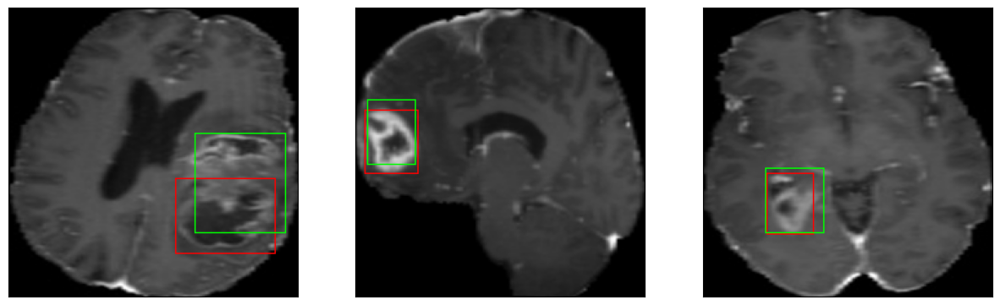

52/52 [==============================] - 38s 738ms/step - loss: 6.4088 - IoU: 0.5910 - val_loss: 6.7571 - val_IoU: 0.6332
Epoch 35/100
52/52 [==============================] - ETA: 0s - loss: 5.7555 - IoU: 0.6227
Epoch 35: val_loss improved from 6.75710 to 6.59546, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 145ms/step


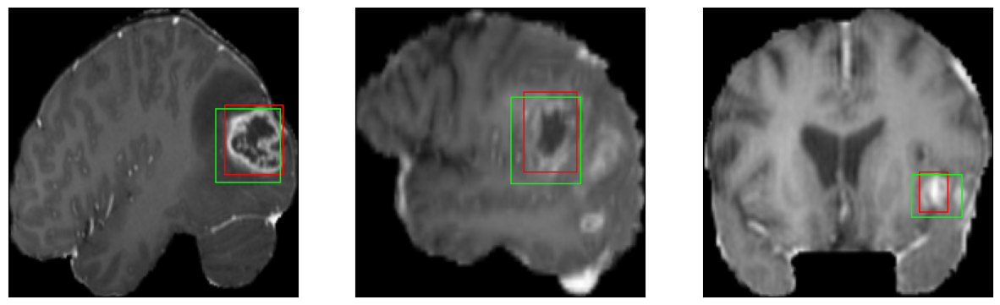

52/52 [==============================] - 39s 768ms/step - loss: 5.7555 - IoU: 0.6227 - val_loss: 6.5955 - val_IoU: 0.6338
Epoch 36/100
52/52 [==============================] - ETA: 0s - loss: 6.2729 - IoU: 0.6016
Epoch 36: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 148ms/step


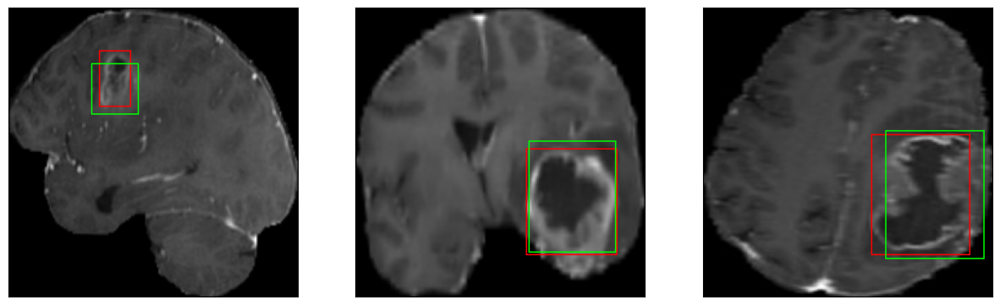

52/52 [==============================] - 21s 400ms/step - loss: 6.2729 - IoU: 0.6016 - val_loss: 11.0539 - val_IoU: 0.5687
Epoch 37/100
52/52 [==============================] - ETA: 0s - loss: 5.6936 - IoU: 0.6311
Epoch 37: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 144ms/step


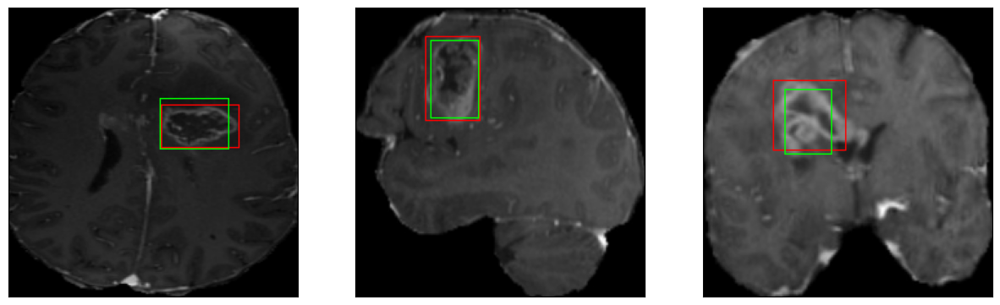

52/52 [==============================] - 20s 395ms/step - loss: 5.6936 - IoU: 0.6311 - val_loss: 7.8203 - val_IoU: 0.5897
Epoch 38/100
52/52 [==============================] - ETA: 0s - loss: 6.0089 - IoU: 0.6041
Epoch 38: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 144ms/step


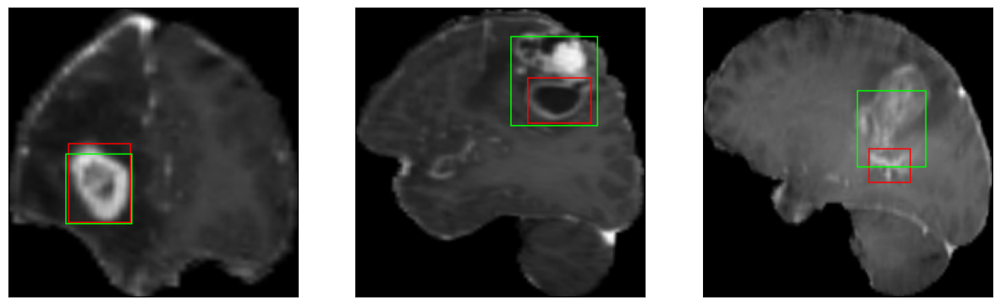

52/52 [==============================] - 20s 386ms/step - loss: 6.0089 - IoU: 0.6041 - val_loss: 8.1683 - val_IoU: 0.5516
Epoch 39/100
52/52 [==============================] - ETA: 0s - loss: 5.4979 - IoU: 0.6309
Epoch 39: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 151ms/step


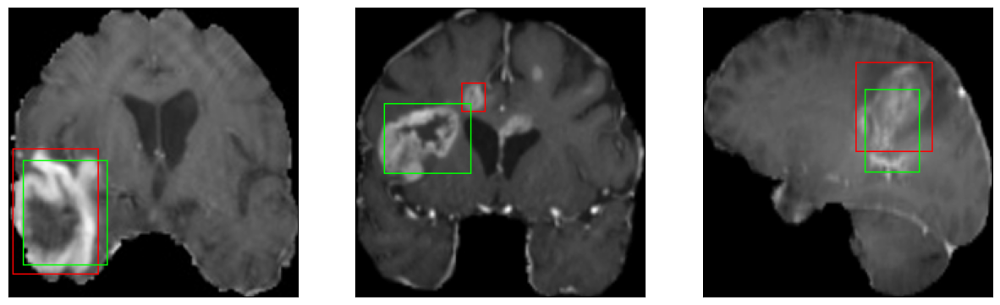

52/52 [==============================] - 21s 397ms/step - loss: 5.4979 - IoU: 0.6309 - val_loss: 8.9075 - val_IoU: 0.5514
Epoch 40/100
52/52 [==============================] - ETA: 0s - loss: 5.5551 - IoU: 0.6265
Epoch 40: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 144ms/step


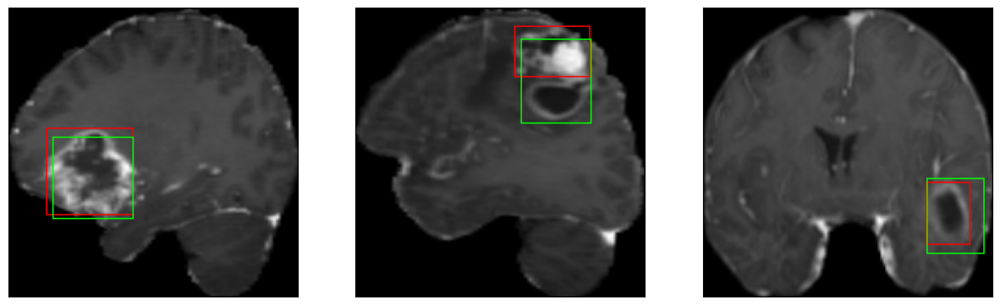

52/52 [==============================] - 20s 390ms/step - loss: 5.5551 - IoU: 0.6265 - val_loss: 6.8891 - val_IoU: 0.6247
Epoch 41/100
52/52 [==============================] - ETA: 0s - loss: 5.7083 - IoU: 0.6287
Epoch 41: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 143ms/step


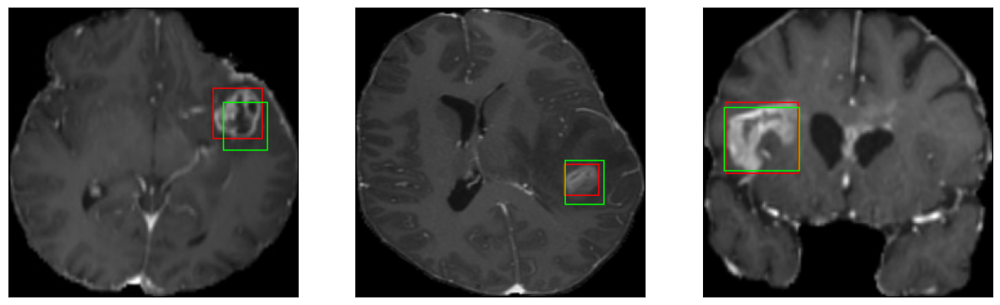

52/52 [==============================] - 20s 392ms/step - loss: 5.7083 - IoU: 0.6287 - val_loss: 8.0515 - val_IoU: 0.5801
Epoch 42/100
52/52 [==============================] - ETA: 0s - loss: 5.5036 - IoU: 0.6295
Epoch 42: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 144ms/step


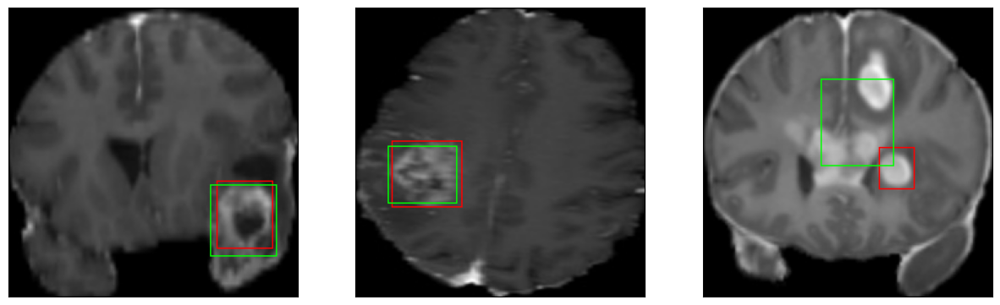

52/52 [==============================] - 20s 380ms/step - loss: 5.5036 - IoU: 0.6295 - val_loss: 7.8155 - val_IoU: 0.6100
Epoch 43/100
52/52 [==============================] - ETA: 0s - loss: 5.4249 - IoU: 0.6376
Epoch 43: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 146ms/step


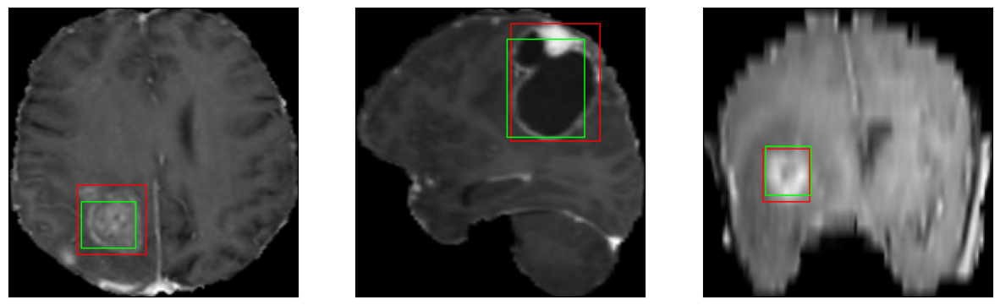

52/52 [==============================] - 20s 387ms/step - loss: 5.4249 - IoU: 0.6376 - val_loss: 6.8373 - val_IoU: 0.6184
Epoch 44/100
52/52 [==============================] - ETA: 0s - loss: 5.2247 - IoU: 0.6457
Epoch 44: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 145ms/step


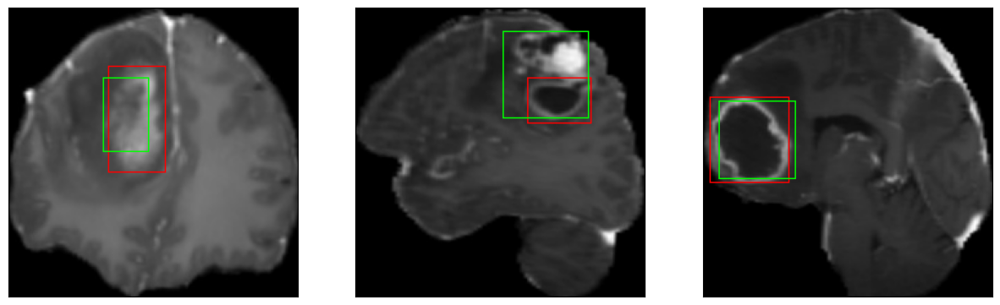

52/52 [==============================] - 20s 394ms/step - loss: 5.2247 - IoU: 0.6457 - val_loss: 8.5420 - val_IoU: 0.5870
Epoch 45/100
52/52 [==============================] - ETA: 0s - loss: 5.4414 - IoU: 0.6382
Epoch 45: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 144ms/step


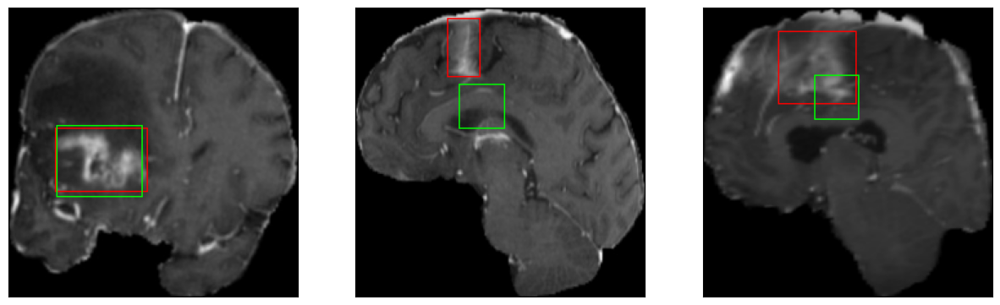

52/52 [==============================] - 20s 384ms/step - loss: 5.4414 - IoU: 0.6382 - val_loss: 8.5287 - val_IoU: 0.6166
Epoch 46/100
52/52 [==============================] - ETA: 0s - loss: 5.3697 - IoU: 0.6435
Epoch 46: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 148ms/step


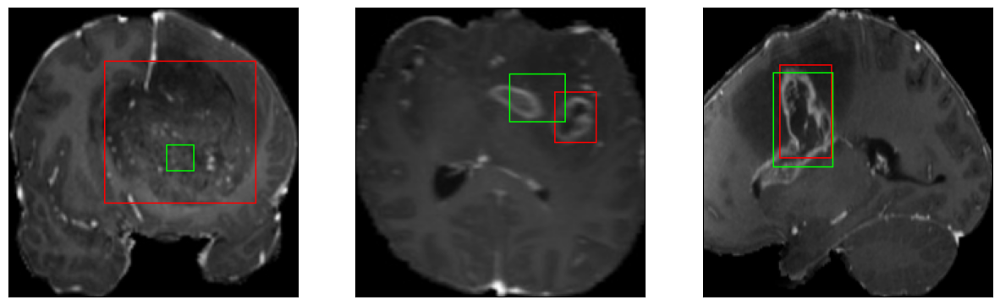

52/52 [==============================] - 21s 405ms/step - loss: 5.3697 - IoU: 0.6435 - val_loss: 7.4245 - val_IoU: 0.6207
Epoch 47/100
52/52 [==============================] - ETA: 0s - loss: 5.3164 - IoU: 0.6403
Epoch 47: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 148ms/step


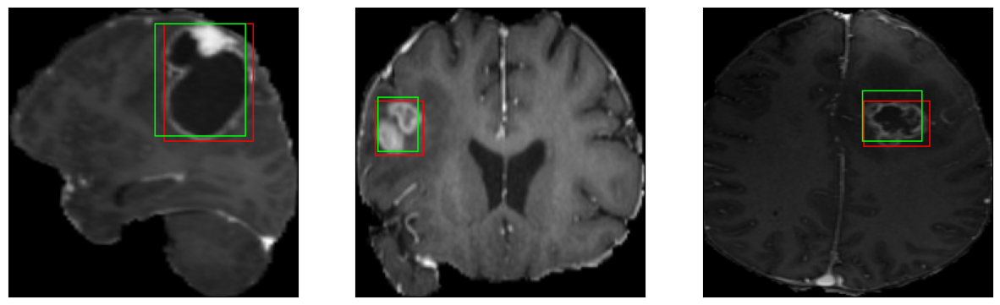

52/52 [==============================] - 20s 391ms/step - loss: 5.3164 - IoU: 0.6403 - val_loss: 7.5919 - val_IoU: 0.6075
Epoch 48/100
52/52 [==============================] - ETA: 0s - loss: 5.5537 - IoU: 0.6336
Epoch 48: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 147ms/step


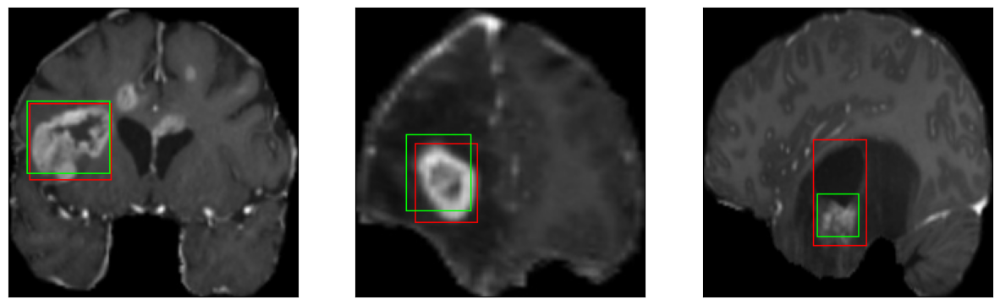

52/52 [==============================] - 20s 393ms/step - loss: 5.5537 - IoU: 0.6336 - val_loss: 9.0263 - val_IoU: 0.5945
Epoch 49/100
52/52 [==============================] - ETA: 0s - loss: 5.2581 - IoU: 0.6440
Epoch 49: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 145ms/step


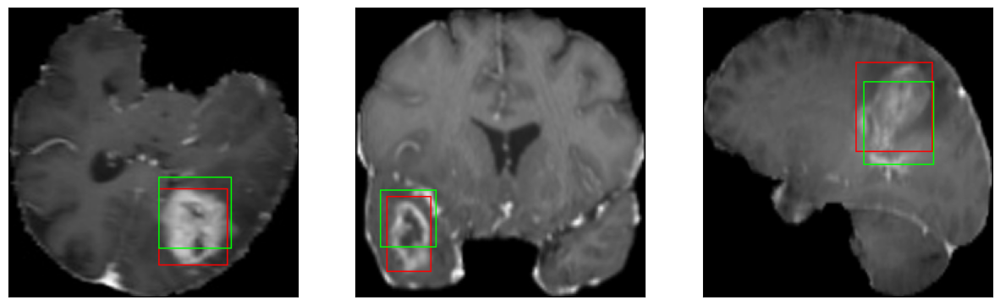

52/52 [==============================] - 20s 386ms/step - loss: 5.2581 - IoU: 0.6440 - val_loss: 7.3022 - val_IoU: 0.6181
Epoch 50/100
52/52 [==============================] - ETA: 0s - loss: 5.5780 - IoU: 0.6172
Epoch 50: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 144ms/step


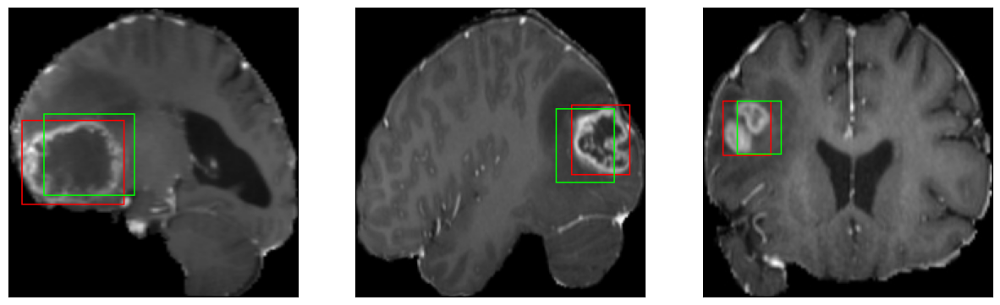

52/52 [==============================] - 20s 390ms/step - loss: 5.5780 - IoU: 0.6172 - val_loss: 8.2736 - val_IoU: 0.5526
Epoch 51/100
52/52 [==============================] - ETA: 0s - loss: 5.3671 - IoU: 0.6324
Epoch 51: val_loss did not improve from 6.59546
8/8 [==============================] - 1s 145ms/step


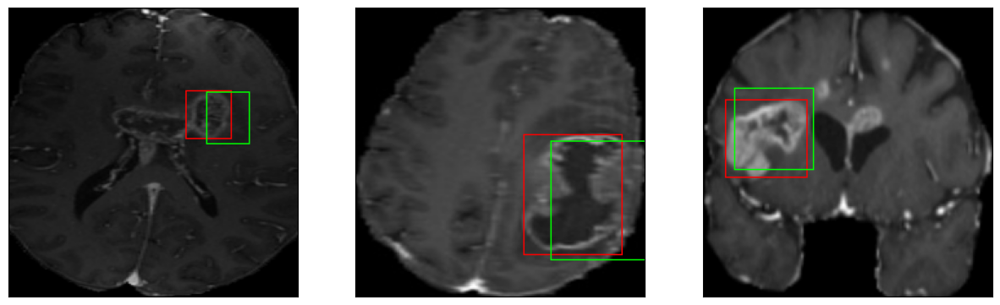

52/52 [==============================] - 20s 388ms/step - loss: 5.3671 - IoU: 0.6324 - val_loss: 7.9245 - val_IoU: 0.5674
Epoch 52/100
52/52 [==============================] - ETA: 0s - loss: 5.0672 - IoU: 0.6563
Epoch 52: val_loss improved from 6.59546 to 6.48427, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


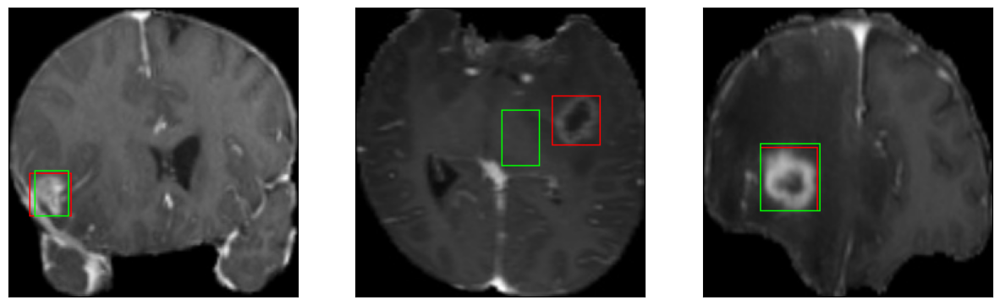

52/52 [==============================] - 36s 701ms/step - loss: 5.0672 - IoU: 0.6563 - val_loss: 6.4843 - val_IoU: 0.6525
Epoch 53/100
52/52 [==============================] - ETA: 0s - loss: 5.3241 - IoU: 0.6375
Epoch 53: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 151ms/step


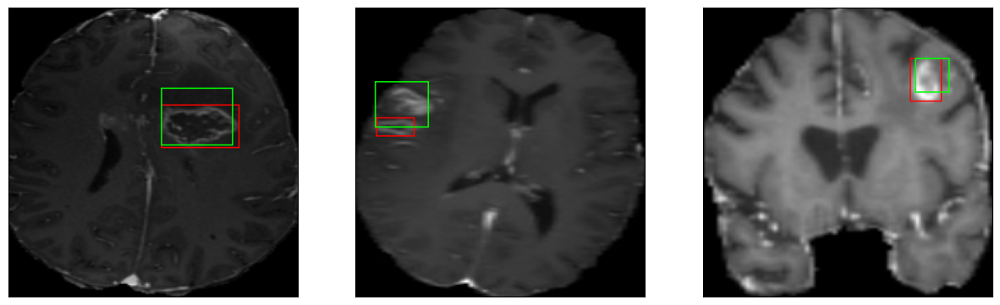

52/52 [==============================] - 21s 401ms/step - loss: 5.3241 - IoU: 0.6375 - val_loss: 8.9292 - val_IoU: 0.5435
Epoch 54/100
52/52 [==============================] - ETA: 0s - loss: 5.2348 - IoU: 0.6487
Epoch 54: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 149ms/step


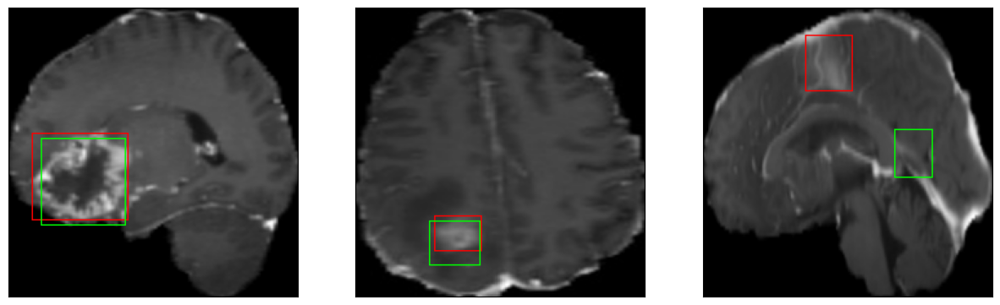

52/52 [==============================] - 21s 399ms/step - loss: 5.2348 - IoU: 0.6487 - val_loss: 7.9784 - val_IoU: 0.5828
Epoch 55/100
52/52 [==============================] - ETA: 0s - loss: 5.2870 - IoU: 0.6404
Epoch 55: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 145ms/step


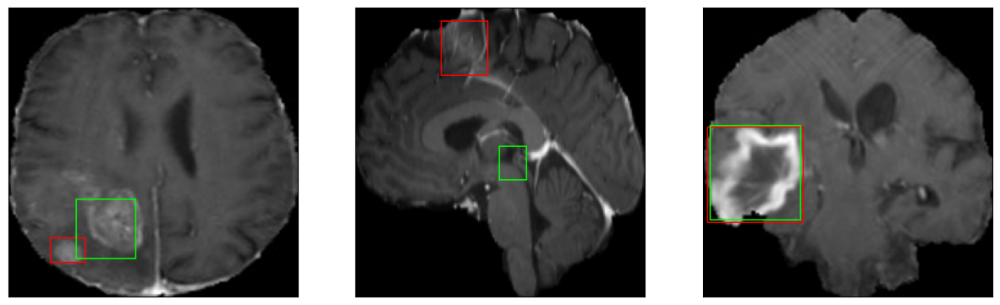

52/52 [==============================] - 20s 388ms/step - loss: 5.2870 - IoU: 0.6404 - val_loss: 6.8691 - val_IoU: 0.6373
Epoch 56/100
52/52 [==============================] - ETA: 0s - loss: 5.1000 - IoU: 0.6463
Epoch 56: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 150ms/step


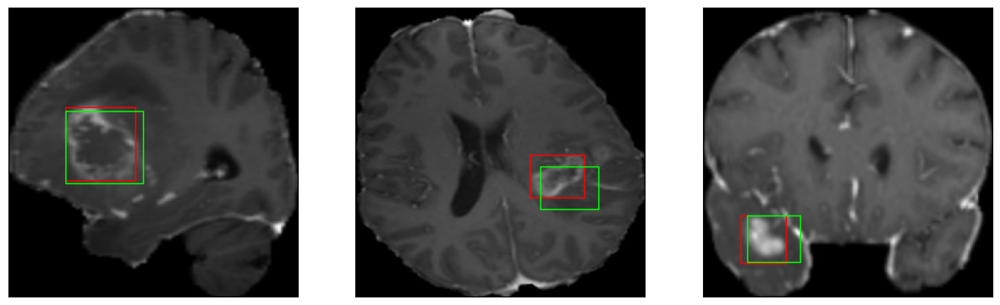

52/52 [==============================] - 20s 391ms/step - loss: 5.1000 - IoU: 0.6463 - val_loss: 7.3947 - val_IoU: 0.5984
Epoch 57/100
52/52 [==============================] - ETA: 0s - loss: 5.1250 - IoU: 0.6495
Epoch 57: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 147ms/step


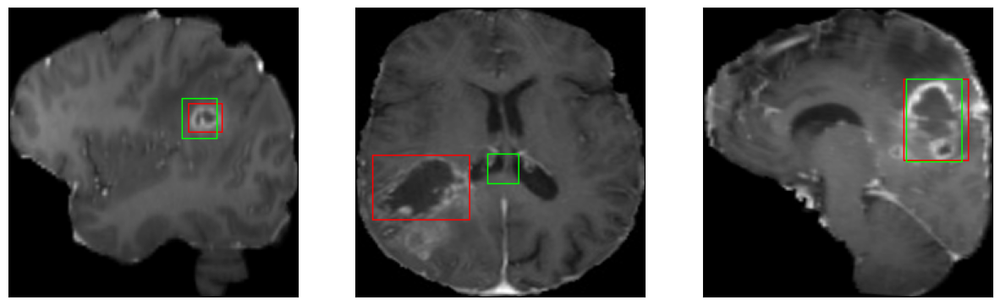

52/52 [==============================] - 20s 392ms/step - loss: 5.1250 - IoU: 0.6495 - val_loss: 6.6954 - val_IoU: 0.6505
Epoch 58/100
52/52 [==============================] - ETA: 0s - loss: 4.9628 - IoU: 0.6543
Epoch 58: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 147ms/step


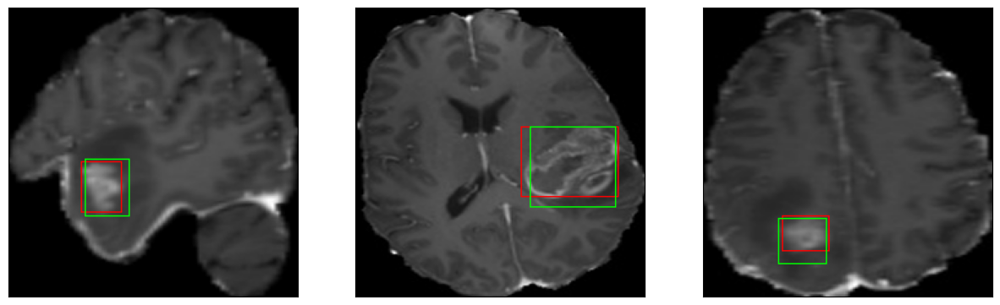

52/52 [==============================] - 20s 385ms/step - loss: 4.9628 - IoU: 0.6543 - val_loss: 7.1549 - val_IoU: 0.6347
Epoch 59/100
52/52 [==============================] - ETA: 0s - loss: 5.0872 - IoU: 0.6486
Epoch 59: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 149ms/step


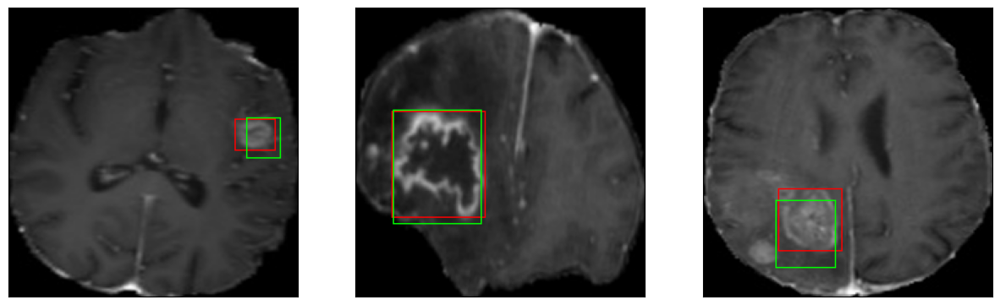

52/52 [==============================] - 21s 400ms/step - loss: 5.0872 - IoU: 0.6486 - val_loss: 7.6098 - val_IoU: 0.6006
Epoch 60/100
52/52 [==============================] - ETA: 0s - loss: 5.0469 - IoU: 0.6528
Epoch 60: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 146ms/step


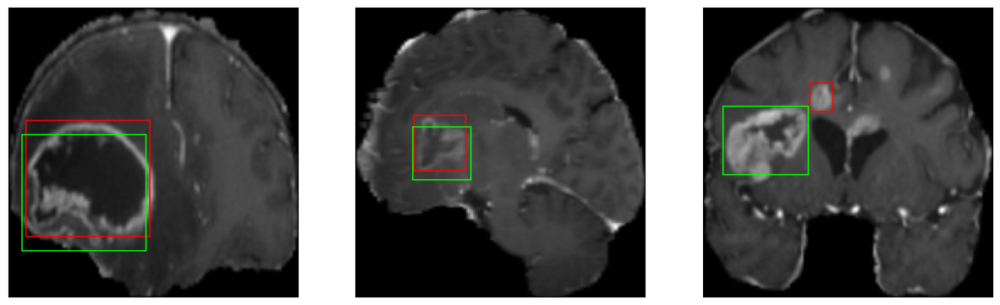

52/52 [==============================] - 20s 391ms/step - loss: 5.0469 - IoU: 0.6528 - val_loss: 6.8553 - val_IoU: 0.6491
Epoch 61/100
52/52 [==============================] - ETA: 0s - loss: 4.8425 - IoU: 0.6670
Epoch 61: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 147ms/step


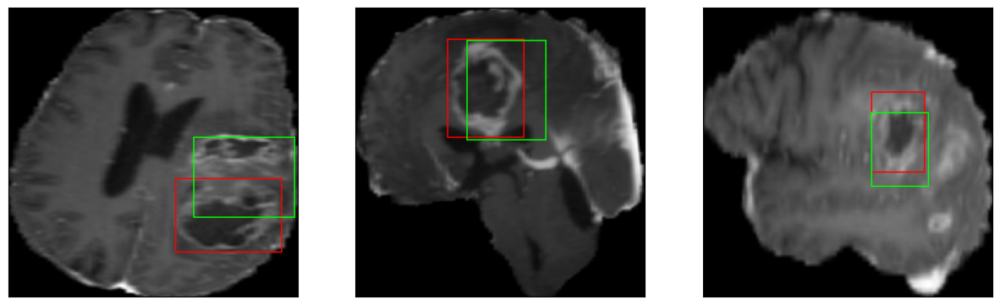

52/52 [==============================] - 20s 390ms/step - loss: 4.8425 - IoU: 0.6670 - val_loss: 6.8574 - val_IoU: 0.6321
Epoch 62/100
52/52 [==============================] - ETA: 0s - loss: 4.8258 - IoU: 0.6665
Epoch 62: val_loss did not improve from 6.48427
8/8 [==============================] - 1s 147ms/step


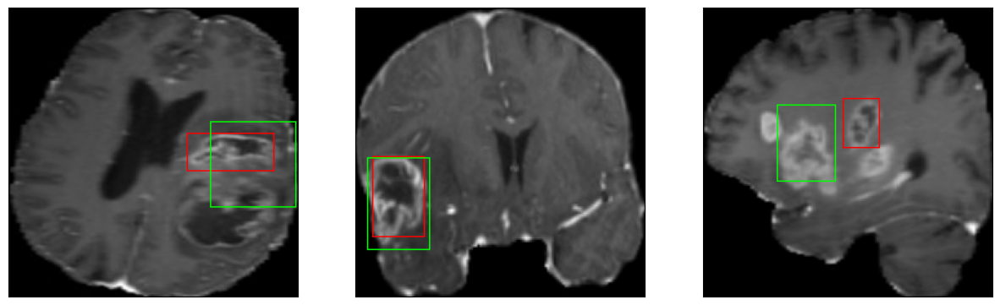

52/52 [==============================] - 21s 399ms/step - loss: 4.8258 - IoU: 0.6665 - val_loss: 7.2664 - val_IoU: 0.6417
Epoch 63/100
52/52 [==============================] - ETA: 0s - loss: 4.7875 - IoU: 0.6682
Epoch 63: val_loss improved from 6.48427 to 6.45746, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 148ms/step


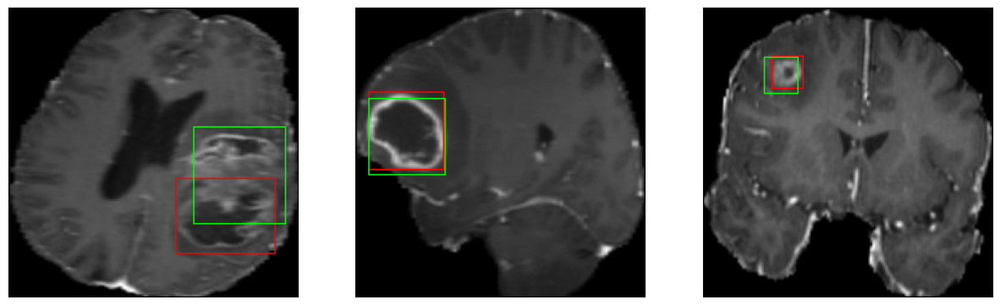

52/52 [==============================] - 37s 714ms/step - loss: 4.7875 - IoU: 0.6682 - val_loss: 6.4575 - val_IoU: 0.6586
Epoch 64/100
52/52 [==============================] - ETA: 0s - loss: 4.7376 - IoU: 0.6699
Epoch 64: val_loss did not improve from 6.45746
8/8 [==============================] - 1s 153ms/step


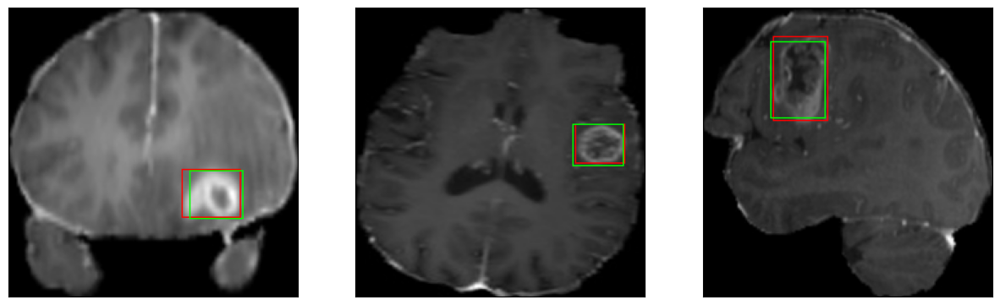

52/52 [==============================] - 21s 405ms/step - loss: 4.7376 - IoU: 0.6699 - val_loss: 6.6764 - val_IoU: 0.6568
Epoch 65/100
52/52 [==============================] - ETA: 0s - loss: 4.8566 - IoU: 0.6658
Epoch 65: val_loss did not improve from 6.45746
8/8 [==============================] - 1s 151ms/step


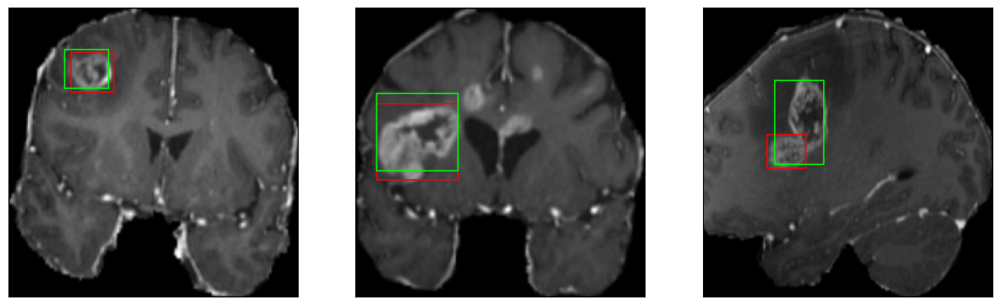

52/52 [==============================] - 20s 393ms/step - loss: 4.8566 - IoU: 0.6658 - val_loss: 7.3406 - val_IoU: 0.6389
Epoch 66/100
52/52 [==============================] - ETA: 0s - loss: 4.9071 - IoU: 0.6585
Epoch 66: val_loss improved from 6.45746 to 6.24911, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 144ms/step


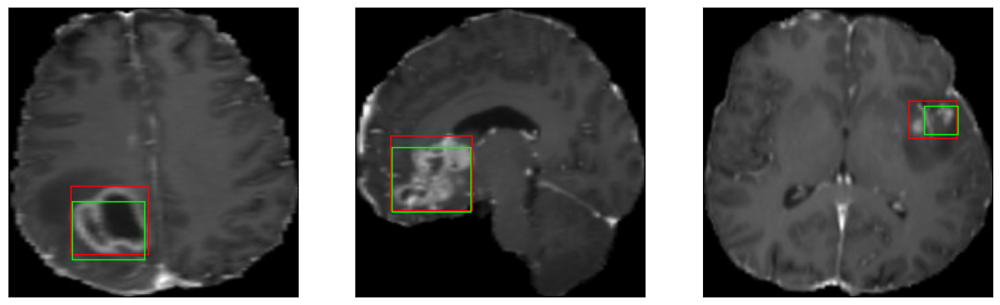

52/52 [==============================] - 32s 625ms/step - loss: 4.9071 - IoU: 0.6585 - val_loss: 6.2491 - val_IoU: 0.6701
Epoch 67/100
52/52 [==============================] - ETA: 0s - loss: 5.0469 - IoU: 0.6489
Epoch 67: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 151ms/step


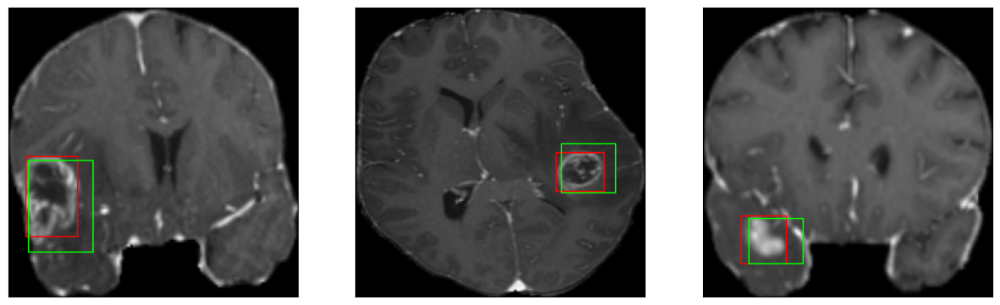

52/52 [==============================] - 21s 402ms/step - loss: 5.0469 - IoU: 0.6489 - val_loss: 7.7235 - val_IoU: 0.5958
Epoch 68/100
52/52 [==============================] - ETA: 0s - loss: 4.7373 - IoU: 0.6635
Epoch 68: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 148ms/step


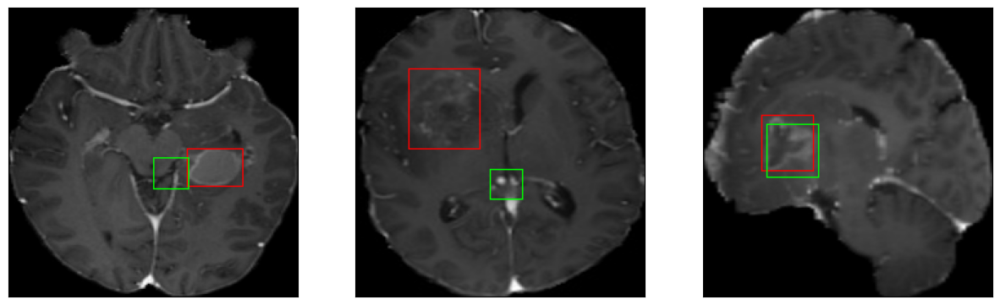

52/52 [==============================] - 20s 394ms/step - loss: 4.7373 - IoU: 0.6635 - val_loss: 7.0405 - val_IoU: 0.6482
Epoch 69/100
52/52 [==============================] - ETA: 0s - loss: 4.7203 - IoU: 0.6633
Epoch 69: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 147ms/step


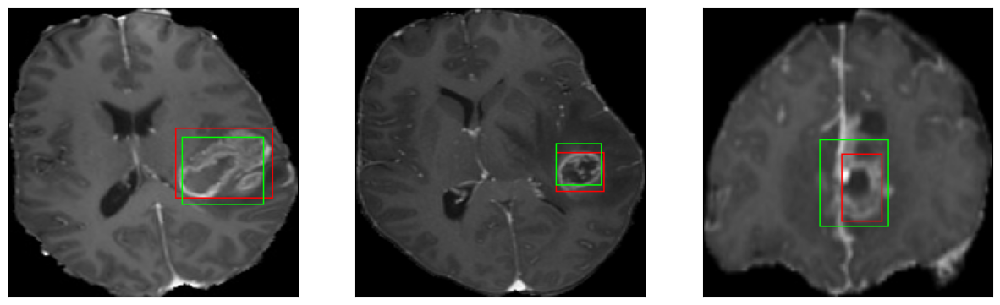

52/52 [==============================] - 21s 399ms/step - loss: 4.7203 - IoU: 0.6633 - val_loss: 6.9102 - val_IoU: 0.6414
Epoch 70/100
52/52 [==============================] - ETA: 0s - loss: 4.8175 - IoU: 0.6593
Epoch 70: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 145ms/step


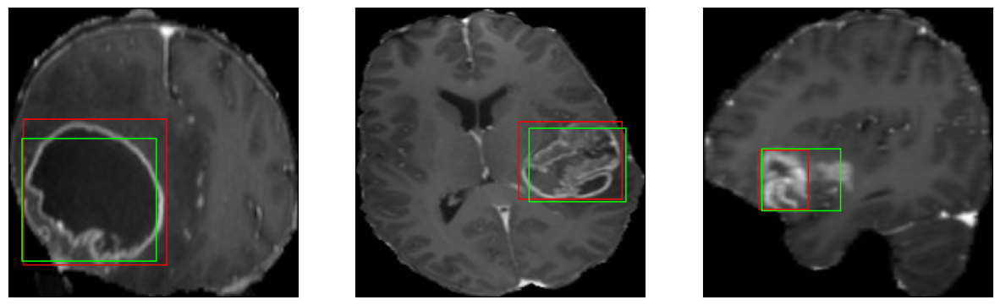

52/52 [==============================] - 20s 388ms/step - loss: 4.8175 - IoU: 0.6593 - val_loss: 6.6338 - val_IoU: 0.6544
Epoch 71/100
52/52 [==============================] - ETA: 0s - loss: 4.8620 - IoU: 0.6644
Epoch 71: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 147ms/step


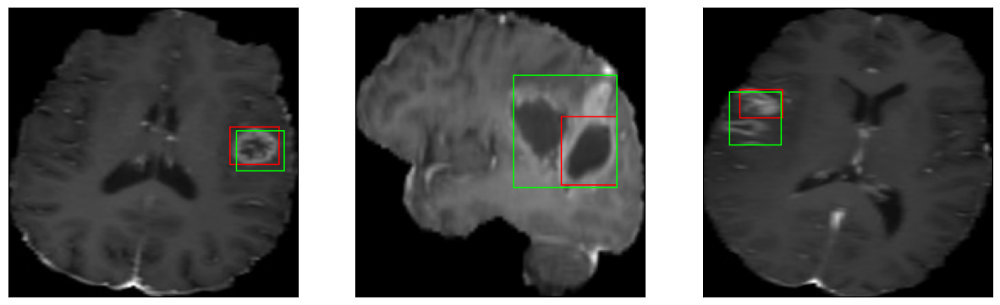

52/52 [==============================] - 20s 385ms/step - loss: 4.8620 - IoU: 0.6644 - val_loss: 6.7102 - val_IoU: 0.6536
Epoch 72/100
52/52 [==============================] - ETA: 0s - loss: 4.7008 - IoU: 0.6746
Epoch 72: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 149ms/step


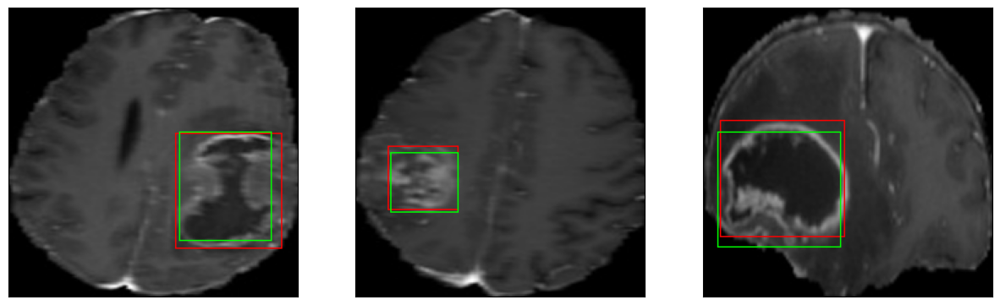

52/52 [==============================] - 20s 396ms/step - loss: 4.7008 - IoU: 0.6746 - val_loss: 6.8106 - val_IoU: 0.6548
Epoch 73/100
52/52 [==============================] - ETA: 0s - loss: 4.9250 - IoU: 0.6598
Epoch 73: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 147ms/step


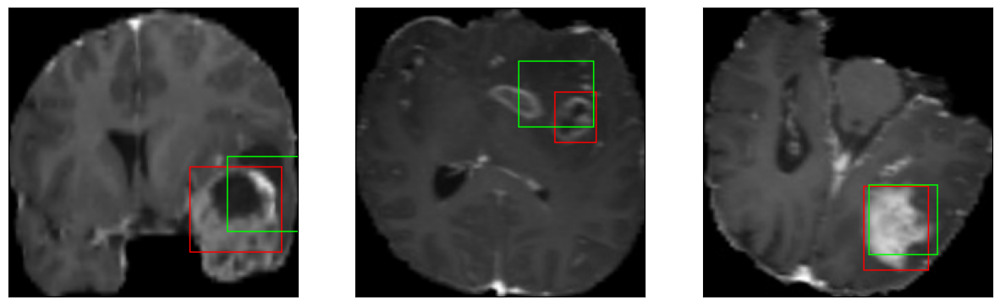

52/52 [==============================] - 20s 394ms/step - loss: 4.9250 - IoU: 0.6598 - val_loss: 10.9988 - val_IoU: 0.5620
Epoch 74/100
52/52 [==============================] - ETA: 0s - loss: 5.5699 - IoU: 0.6315
Epoch 74: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 147ms/step


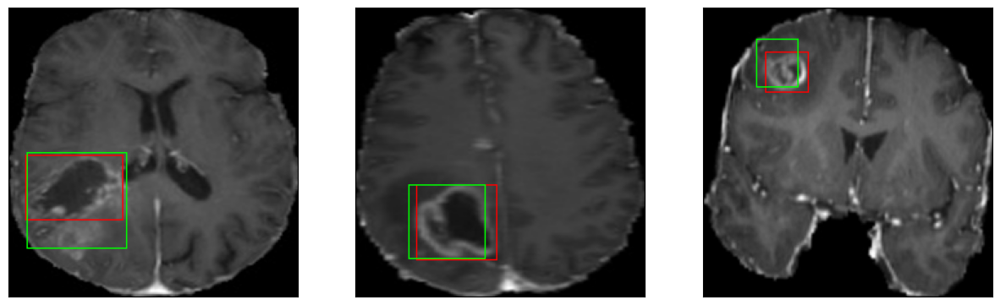

52/52 [==============================] - 20s 387ms/step - loss: 5.5699 - IoU: 0.6315 - val_loss: 22.6600 - val_IoU: 0.4662
Epoch 75/100
52/52 [==============================] - ETA: 0s - loss: 5.0339 - IoU: 0.6468
Epoch 75: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 146ms/step


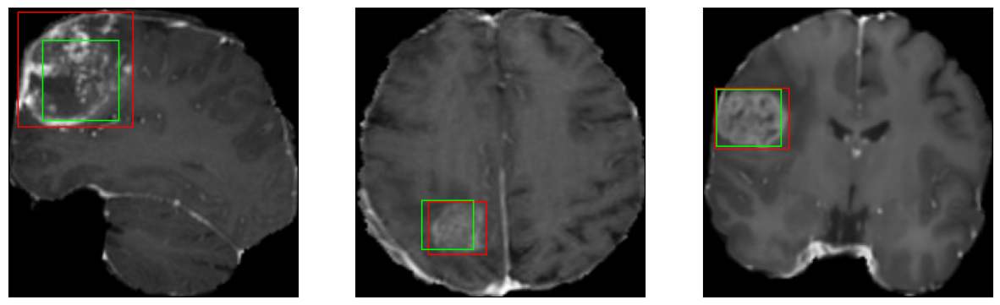

52/52 [==============================] - 21s 410ms/step - loss: 5.0339 - IoU: 0.6468 - val_loss: 11.1379 - val_IoU: 0.5606
Epoch 76/100
52/52 [==============================] - ETA: 0s - loss: 5.0822 - IoU: 0.6456
Epoch 76: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 149ms/step


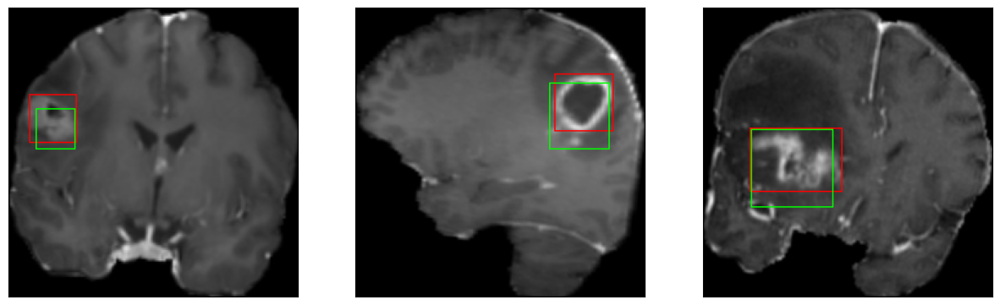

52/52 [==============================] - 20s 389ms/step - loss: 5.0822 - IoU: 0.6456 - val_loss: 7.9154 - val_IoU: 0.5687
Epoch 77/100
52/52 [==============================] - ETA: 0s - loss: 4.7012 - IoU: 0.6721
Epoch 77: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 148ms/step


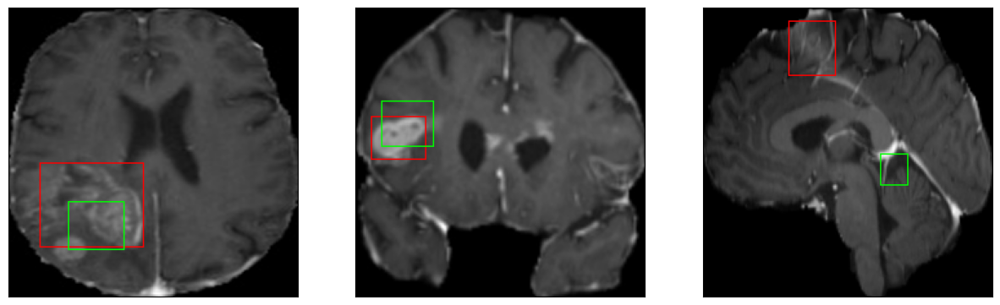

52/52 [==============================] - 20s 390ms/step - loss: 4.7012 - IoU: 0.6721 - val_loss: 7.2586 - val_IoU: 0.6156
Epoch 78/100
52/52 [==============================] - ETA: 0s - loss: 4.8076 - IoU: 0.6639
Epoch 78: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 145ms/step


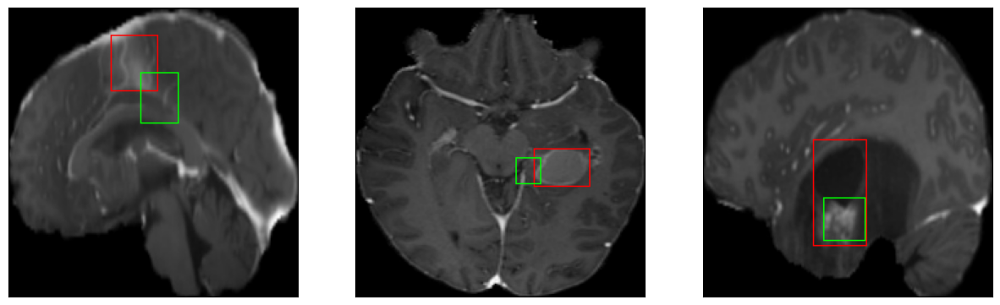

52/52 [==============================] - 20s 386ms/step - loss: 4.8076 - IoU: 0.6639 - val_loss: 7.4190 - val_IoU: 0.6481
Epoch 79/100
52/52 [==============================] - ETA: 0s - loss: 4.7996 - IoU: 0.6680
Epoch 79: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 144ms/step


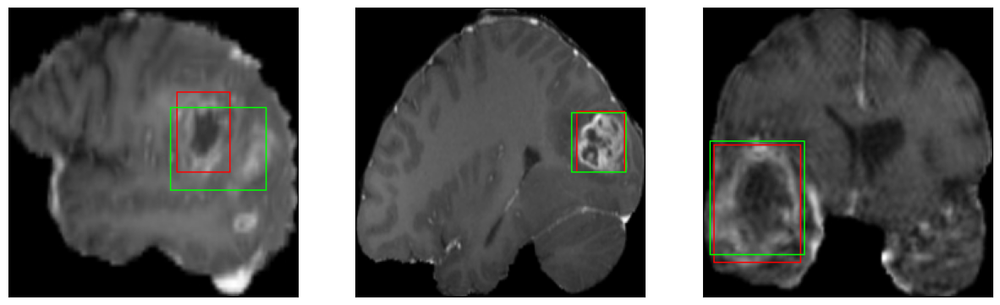

52/52 [==============================] - 21s 398ms/step - loss: 4.7996 - IoU: 0.6680 - val_loss: 10.9250 - val_IoU: 0.6113
Epoch 80/100
52/52 [==============================] - ETA: 0s - loss: 4.6463 - IoU: 0.6782
Epoch 80: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 148ms/step


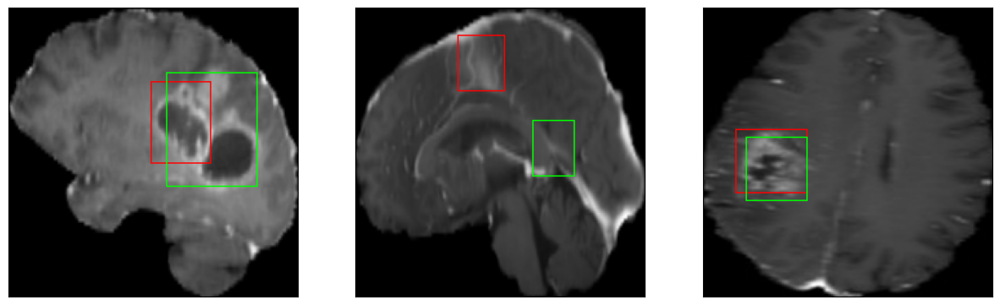

52/52 [==============================] - 20s 392ms/step - loss: 4.6463 - IoU: 0.6782 - val_loss: 7.0817 - val_IoU: 0.6295
Epoch 81/100
52/52 [==============================] - ETA: 0s - loss: 4.6012 - IoU: 0.6757
Epoch 81: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 149ms/step


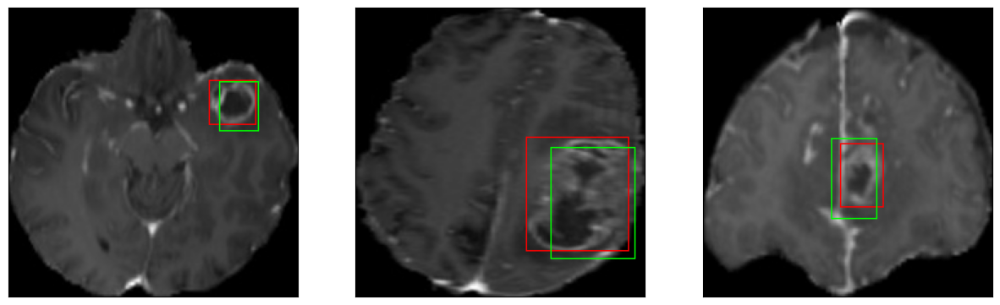

52/52 [==============================] - 21s 396ms/step - loss: 4.6012 - IoU: 0.6757 - val_loss: 6.7360 - val_IoU: 0.6498
Epoch 82/100
52/52 [==============================] - ETA: 0s - loss: 4.6993 - IoU: 0.6699
Epoch 82: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 149ms/step


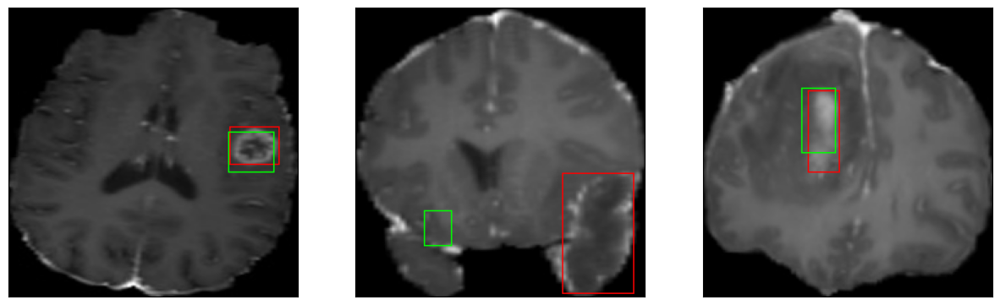

52/52 [==============================] - 20s 393ms/step - loss: 4.6993 - IoU: 0.6699 - val_loss: 6.4295 - val_IoU: 0.6546
Epoch 83/100
52/52 [==============================] - ETA: 0s - loss: 4.5359 - IoU: 0.6718
Epoch 83: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 146ms/step


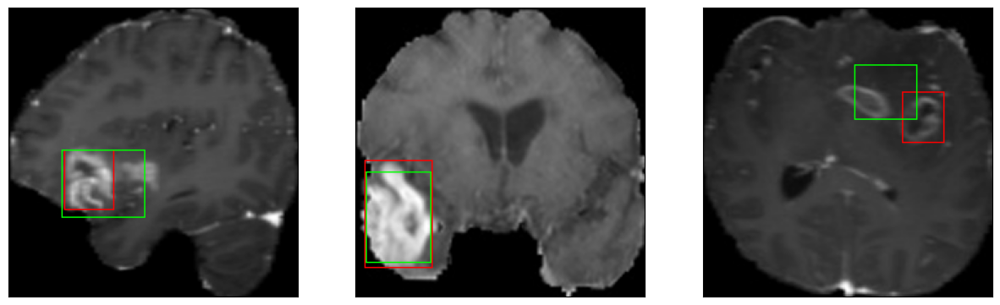

52/52 [==============================] - 21s 398ms/step - loss: 4.5359 - IoU: 0.6718 - val_loss: 6.3920 - val_IoU: 0.6587
Epoch 84/100
52/52 [==============================] - ETA: 0s - loss: 4.9714 - IoU: 0.6504
Epoch 84: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 146ms/step


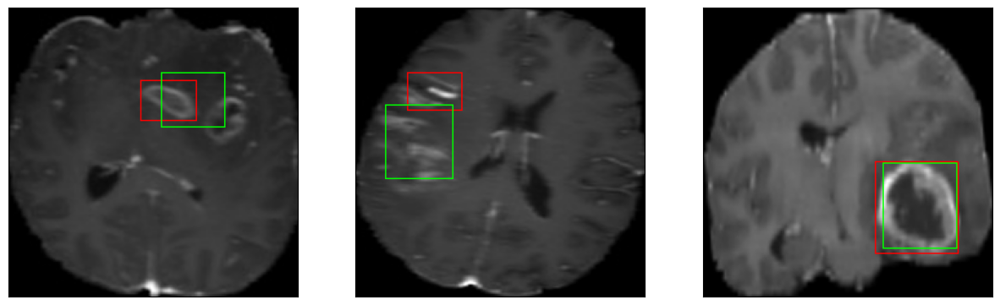

52/52 [==============================] - 20s 386ms/step - loss: 4.9714 - IoU: 0.6504 - val_loss: 6.5753 - val_IoU: 0.6687
Epoch 85/100
52/52 [==============================] - ETA: 0s - loss: 4.3858 - IoU: 0.6785
Epoch 85: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 147ms/step


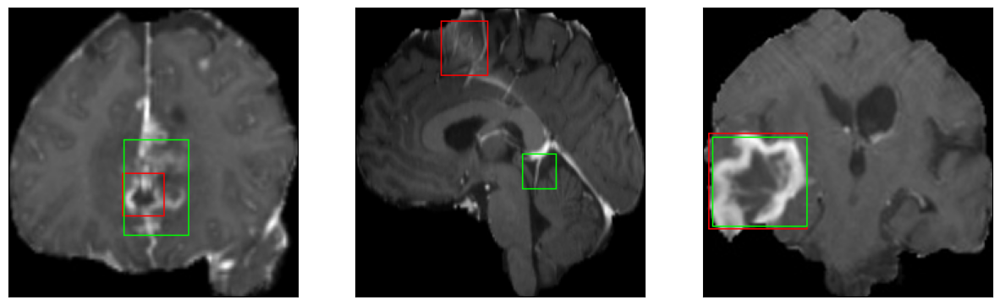

52/52 [==============================] - 20s 393ms/step - loss: 4.3858 - IoU: 0.6785 - val_loss: 8.0936 - val_IoU: 0.5936
Epoch 86/100
52/52 [==============================] - ETA: 0s - loss: 4.4808 - IoU: 0.6800
Epoch 86: val_loss did not improve from 6.24911
8/8 [==============================] - 1s 146ms/step


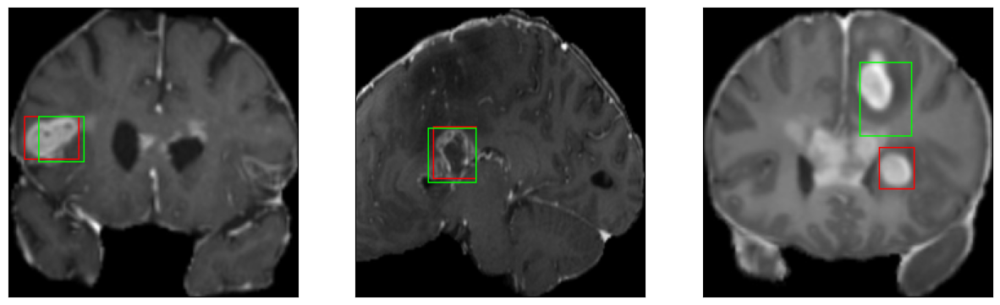

52/52 [==============================] - 20s 396ms/step - loss: 4.4808 - IoU: 0.6800 - val_loss: 6.7306 - val_IoU: 0.6461


In [25]:
hist = model.fit(
        train_dataset,
        epochs=100,
        validation_data = val_dataset,
        callbacks = callbacks_list
        )

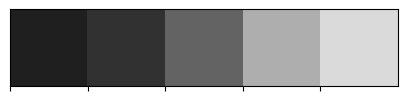

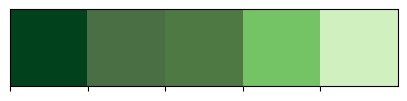

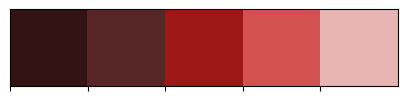

In [26]:
import seaborn as sns
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0']

sns.palplot(colors_dark)
sns.palplot(colors_green)
sns.palplot(colors_red)

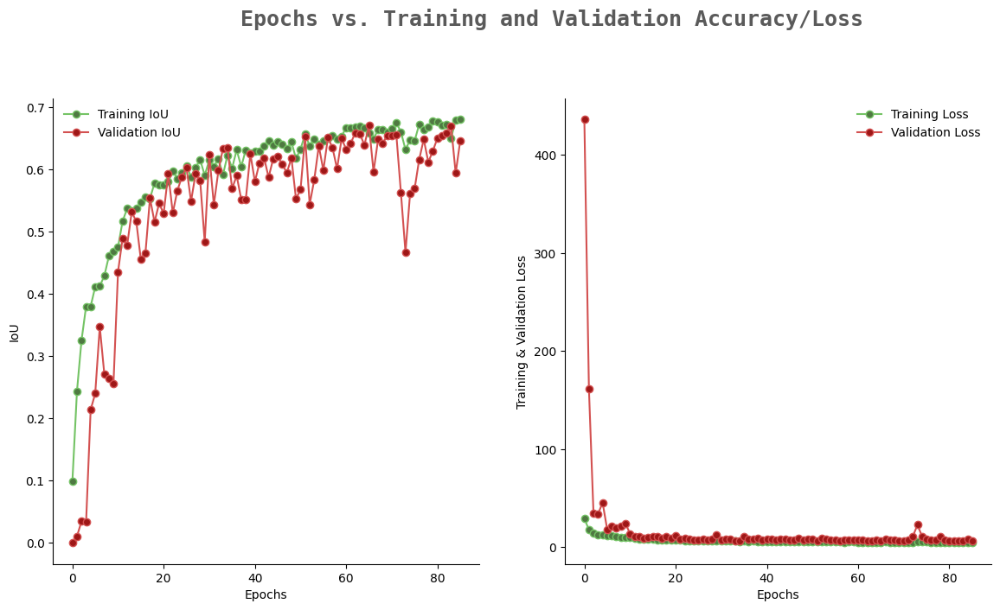

In [28]:
from warnings import filterwarnings
filterwarnings('ignore')

epochs = [i for i in range(86)]
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = hist.history['IoU']
train_loss = hist.history['loss']
val_acc = hist.history['val_IoU']
val_loss = hist.history['val_loss']

fig.text(s='Epochs vs. Training and Validation Accuracy/Loss',size=18,fontweight='bold',
             fontname='monospace',color=colors_dark[1],y=1,x=0.28,alpha=0.8)

sns.despine()
ax[0].plot(epochs, train_acc, marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label = 'Training IoU')
ax[0].plot(epochs, val_acc, marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation IoU')
ax[0].legend(frameon=False)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('IoU')

sns.despine()
ax[1].plot(epochs, train_loss, marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label ='Training Loss')
ax[1].plot(epochs, val_loss, marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation Loss')
ax[1].legend(frameon=False)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Training & Validation Loss')

fig.show()

In [30]:
model = tf.keras.models.load_model('./model_checkpoint_RESNET/model_RESNET.h5', compile=False)

In [32]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

In [33]:
model.evaluate(test_dataset)

15/15 [==============================] - 4s 88ms/step - loss: 8.7343 - IoU: 0.5762


[8.734281539916992, 0.5761948227882385]